In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mpl_toolkits.basemap import Basemap
from scipy import stats
from scipy import interpolate
import matplotlib.cm as cm
import numpy.polynomial.polynomial as poly 
from ipywidgets import widgets
from IPython.display import display
%matplotlib inline
%matplotlib notebook

In [2]:
def errorfill(x, y ,yerr,color=None, fmt = None, label = None, alpha_fill=0.3, ax=None):
    '''Function to create error bands rather than error bars on a scatter plot
    Input:
    x : an array of floats
    y: an array of floats
    yerr: array of flotas as the errors of the y values
    Output:
    Plot of values with error bands'''
    ax = ax if ax is not None else plt.gca()
    if color is None:
        color = ax._get_lines.color_cycle.next()
    if np.isscalar(yerr) or len(yerr) == len(y):
        ymin = y - yerr
        ymax = y + yerr
    elif len(yerr) == 2:
        ymin, ymax = yerr
    ax.scatter(x, y, color=color, label=label)
    ax.plot(x, y, color=color)
    ax.fill_between(x, ymax, ymin, color=color, alpha=alpha_fill)

In [3]:
def MYConcatenate(Years, MY, FileFormat):
    '''Function to create a single data frame from separate data files, 
    specifically for the files containing the albedo data from mcs
    Input:
    Years: The earth year for the specific data file
    MY: The martian year gor the data obtained.
    FileFormat: The Julian date assigned to the file.
    '''
    Gen_File = '../WORK/MCS_ALBEDO_DATASETS/MY{}/A6_{}_{}_albedo.txt'
    MY_List=[]
    for Year in Years:
        df = pd.read_csv(Gen_File.format(MY, Year, FileFormat), 
        header=None, delimiter=r"\s+", names = ['L_s', 'Distance to Sun', 'Longitude',
        'Latitude','Solar zenith angle', 'Emission angle','Radiance', 'Albedo'])
        df['Mars Year'] = MY
        MY_List.append(df)
    return pd.concat(MY_List)

In [4]:
def CreateSubFrame(MarsYearDF, RanL_s, RanAlbedo, RanSZA, RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsYearDF['L_s']
    Lat_MYDF = MarsYearDF['Latitude']
    Long_MYDF= MarsYearDF['Longitude']
    Alb_MYDF = MarsYearDF['Albedo']
    SolZen_MYDF = MarsYearDF['Solar zenith angle']
    MY_SUB = MarsYearDF[(L_s_MYDF <= RanL_s[1])  & (L_s_MYDF >= RanL_s[0]) & 
                        (Alb_MYDF <= RanAlbedo[1]) & (Alb_MYDF >= RanAlbedo[0]) & 
                        (SolZen_MYDF <= RanSZA[1]) & (SolZen_MYDF >= RanSZA[0]) &
                        (Lat_MYDF <= RanLat[1] ) & (Lat_MYDF >= RanLat[0]) & 
                        (Long_MYDF <= RanLong[1]) & (Long_MYDF >= RanLong[0])]
    return MY_SUB

In [5]:
def SubDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=5.0, RanAlbedo=[0.0,1.0], RanSZA=[0.0,70.0], RanLat=[-90,90], RanLong=[-180,180]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateSubFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanAlbedo, RanSZA, RanLat, RanLong)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs   

In [6]:
def SubStats(MYDict):
    '''Function to run statistics on data on the subframes from the dictionaries created by the SubDict function
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubAvg: Average of the Albedo for each subframe in the dictionary
    SubStd: Standard Deviation of the Albedo for each subframe in the dictionary
    Sub_L_s: Average of the  Solar Longitude range for each subframe in the dictionary'''
    SubframeNum = len(MYDict.keys())
    SubAvg = []
    SubStd = []
    Sub_L_s = []
    SubSZAvg = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubAvg.append(np.mean(Subframe['Albedo']))
        SubStd.append(np.std(Subframe['Albedo']))
        Sub_L_s.append(np.mean(Subframe['L_s']))
        SubSZAvg.append(np.mean(Subframe['Solar zenith angle']))
    SubAvg = np.array(SubAvg)
    SubStd = np.array(SubStd)
    Sub_L_s = np.array(Sub_L_s)
    SubSZAvg =np.array(SubSZAvg)
    return SubAvg, SubStd, Sub_L_s, SubSZAvg

In [7]:
def DataAlb(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubAlb = []
    SubSZA = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Latitude'])
        SubLong.append(Subframe['Longitude'])
        SubAlb.append(Subframe['Albedo'])
        SubSZA.append(Subframe['Solar zenith angle'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubAlb = np.array(SubAlb)
    SubSZA = np.array(SubSZA)
    return SubLat, SubLong, SubAlb, SubSZA

In [8]:
def polyval_NaN(p,data):
    '''Function to do a numpy polyval operation on arrays with NaN values 
    Input:
    p = polynomial length based on polyfit
    data = array of data sets that includes NaN values
    Output
    data2: the array with a polyval operation done to it'''
    data2 = np.full_like(data, np.nan)
    good = ~np.isnan(data)
    data2[good] = np.polyval(p,data[good])
    return data2

In [9]:
########
# pco2 #
########
# --------------------------------------------
# Equilibrium vapor pressure over solid CO2
# Brown and Ziegler (1980)
# --------------------------------------------
# Input:
#    T = temperature of solid [K]
# Output:
#    vapor pressure [Pa]
def pco2(T):
    A0 = 2.13807649e1
    A1 = -2.57064700e3
    A2 = -7.78129489e4
    A3 = 4.32506256e6
    A4 = -1.20671368e8
    A5 = 1.34966306e9
    # Pressure in torr
    ptorr = np.exp(A0 + (A1/(T)) + (A2/(T**2)) + (A3/(T**3)) + (A4/(T**4)) + (A5/(T**5)))
    # Pressure in Pa
    p = ptorr*133.3223684211
    return p

In [10]:
########
# tco2 #
########
#-------------------------------------------------------------------------
#Calculate (approximately) the condensation temperature of CO2 at the
#specified pressure(s) (Pa), using the empirical law from Brown and 
#Ziegler (1980). This function calls the pco2() routine.
#-------------------------------------------------------------------------
# Input:
#    p = vapor pressure [Pa]
# Output:
#    temperature of solid [K]
def tco2(p):
    Trange = np.arange(30,350)
    T = interpolate.pchip_interpolate(pco2(Trange),Trange,p)
    return T

In [11]:
# Function: ls2sol
# Purpose: convert Mars "Lsubs" to sol (day of year)
# Input: 
#    ls = areocentric longitude of the Sun [array]
#    n = degree of polynomial fit [scalar]
def ls2sol(ls, n):
    # data
    lsdata = (0,30,60,90,120,150,180,210,240,270,300,330,360) # L_s array
    soldata = (0,61.2,126.6,193.3,257.8,317.5,371.9,421.6,468.5,514.6,562.0,612.9,668.6) # Sol array
    
    # polynomial fit
    p = np.polyfit(lsdata, soldata, n)
    
    # sol for Ls input
    sol = np.polyval(p, ls)
    
    # return result
    return sol

In [12]:
def MYretrieval(dataframe, MY):
    if MY == '28':
        return dataframe[(dataframe['MY'] == 28)]
    elif MY == '29':
        return dataframe[(dataframe['MY'] == 29)]
    elif MY == '30':
        return dataframe[(dataframe['MY'] == 30)]
    elif MY == '31':
        return dataframe[(dataframe['MY'] == 31)]
    elif MY == '32':
        return dataframe[(dataframe['MY'] == 32)]
    elif MY == '33':
        return dataframe[(dataframe['MY'] == 33)]
    elif MY == '34':
        return dataframe[(dataframe['MY'] == 34)]
    elif MY == '35':
        return dataframe[(dataframe['MY'] == 35)]

In [13]:
def CreateEmiFrame(MarsDF, RanL_s, RanLat):
    '''Function to divide previously created data frames in smaller data frames by providing ranges
    Input:
    MarsYearDF: Mars Data frames 
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Several Subframes'''
    L_s_MYDF = MarsDF['L_s']
    Lat_MYDF = MarsDF['Surf_lat']
    Long_MYDF = MarsDF['Surf_lon']
    MY_SUB = MarsDF[(L_s_MYDF <= RanL_s[-1])  & (L_s_MYDF >= RanL_s[0]) &
                        (Lat_MYDF <= RanLat[-1] ) & (Lat_MYDF >= RanLat[0])]
    return MY_SUB

In [14]:
def SubEmiDict(MarsYearDF, TotRanL_s=[0,360], L_sStep=15.0, RanLat=[-90,90]):
    '''Function to create a dictionary of subframes utilizing the CreateSubFrame function, this function will run through
    the dataframes in Solar Longitude step sizes (default is 5 but can be changed) and make the divisions
    Input:
    MarsYearDF: Mars Data frames 
    MY: Martian Year String
    TotRanL_s: range of values for solar longitude
    L_sStep: Step size
    RanL_s: range of Solar Longitude example [0,360]
    RanAlbedo: Albedo Range example [0.5,1.0]
    RanSZA Solar Zenith angle range example [0,45]
    RanLat and RanLong are set as default
    Output: Dictionary of Sub frames'''
    if (TotRanL_s[1]-TotRanL_s[0])%L_sStep != 0:
        raise('Bad Step Size')
    AllSubs = {}
    SubStr = 'MY_SUB{}'
    for i,L_sBound in enumerate(np.arange(TotRanL_s[0], TotRanL_s[1], L_sStep)):
        NewSub = CreateEmiFrame(MarsYearDF, [L_sBound, L_sBound + L_sStep], RanLat)
        AllSubs[SubStr.format(i)] = NewSub
    return AllSubs 

In [15]:
def IRFlux(T):
    '''Calculate the luminosity of the thing.'''
    sigma = 5.67e-8 # W/m**2/K**4
    boltz = sigma * T**4
    return boltz

In [16]:
def DataEmi(MYDict):
    '''Function to store data for latitude, longitude, albedo and solar zenith angle into listts to be used to graph.
    Input:
    MYDict: Dictionary Created by the SubDict Function
    Output:
    SubLat: Latitude array from sub frames
    SubLong: Longitude array from sub frames
    SubAlb: Albedo array from sub frames
    SunSZA: Solar Zenith Angle array from sub frames'''
    SubframeNum = len(MYDict.keys())
    SubLat = []
    SubLong = []
    SubTemp = []
    SubPres = []
    SubIR = []
    SubFPT = []
    SubStr = 'MY_SUB{}'
    for i in range(SubframeNum):
        Subframe = MYDict[SubStr.format(i)]
        SubLat.append(Subframe['Surf_lat'])
        SubLong.append(Subframe['Surf_lon'])
        SubTemp.append(Subframe['T_surf'])
        SubPres.append(Subframe['p_surf'])
        SubIR.append(IRFlux(Subframe['T_surf']))
        SubFPT.append(Subframe['Frost_T'])
    SubLat = np.array(SubLat)
    SubLong = np.array(SubLong)
    SubTemp = np.array(SubTemp)
    SubPres = np.array(SubPres)
    SubIR = np.array(SubIR)
    return SubLat, SubLong, SubTemp, SubPres, SubIR, SubFPT

In [17]:
YearsMY29 = ['2007', '2008', '2009']
MY29 = MYConcatenate(YearsMY29, '29', 'JD2454444-2455131')

In [18]:
YearsMY30 = ['2009', '2010', '2011']
MY30 = MYConcatenate(YearsMY30, '30', 'JD2455131-2455818')

In [19]:
YearsMY31 = ['2011', '2012', '2013']
MY31 = MYConcatenate(YearsMY31, '31', 'JD2455818-2456505')

In [20]:
YearsMY32 = ['2013', '2014', '2015']
MY32 = MYConcatenate(YearsMY32, '32', 'JD2456505-2457192')

In [21]:
YearsMY33 = ['2015', '2016', '2017']
MY33 = MYConcatenate(YearsMY33, '33', 'JD2457192-2457879')

In [22]:
MY29N = MY29[(MY29['Solar zenith angle'] <= 60.0) & (MY29['Latitude'] >= 60.0) & (MY29['Latitude'] <= 90.0)]
MY29N = MY29N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [23]:
MY29S = MY29[(MY29['Solar zenith angle'] <= 60.0) & (MY29['Latitude'] <= -60.0) & (MY29['Latitude'] >= -90.0)] 
MY29S = MY29S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [24]:
MY30N = MY30[(MY30['Solar zenith angle'] <= 60.0) & (MY30['Latitude'] >= 60.0) & (MY30['Latitude'] <= 90.0)]
MY30N = MY30N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [25]:
MY30S = MY30[(MY30['Solar zenith angle'] <= 60.0)& (MY30['Latitude'] >= -90.0) & (MY30['Latitude'] <= -60.0)]
MY30S = MY30S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [26]:
MY31N = MY31[(MY31['Solar zenith angle'] <= 60.0)& (MY31['Latitude'] >= 60.0) & (MY31['Latitude'] <= 90.0)]
MY31N = MY31N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [27]:
MY31S = MY31[(MY31['Solar zenith angle'] <= 60.0)& (MY31['Latitude'] >= -90.0) & (MY31['Latitude'] <= -60.0)]
MY31S = MY31S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [28]:
MY33N = MY33[(MY33['Solar zenith angle'] <= 60.0)& (MY33['Latitude'] >= 60.0) & (MY33['Latitude'] <= 90.0)]
MY33N = MY33N.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [29]:
MY33S = MY33[(MY33['Solar zenith angle'] <= 60.0)& (MY33['Latitude'] >= -90.0) & (MY33['Latitude'] <= -60.0)]
MY33S = MY33S.drop(columns = ['L_s','Distance to Sun','Solar zenith angle','Emission angle','Radiance', 'Mars Year'])

In [30]:
NAlb = pd.concat([MY29N,MY30N,MY31N,MY33N])

In [31]:
SAlb = pd.concat([MY29S,MY30S,MY31S,MY33S])

In [32]:
MY29_SubframesNorth = SubDict(MY29, L_sStep = 15.0, RanLat=[60.0,90.0], RanSZA=[0.0,63.0])

In [33]:
MY30_SubframesNorth = SubDict(MY30, L_sStep = 15.0, RanLat=[60.0,90.0], RanSZA=[0.0,63.0])

In [34]:
MY31_SubframesNorth = SubDict(MY31, L_sStep = 15.0, RanLat=[60.0,90.0], RanSZA=[0.0,63.0])

In [35]:
MY32_SubframesNorth = SubDict(MY32, L_sStep = 15.0, RanLat=[60.0,90.0], RanSZA=[0.0,63.0])

In [36]:
MY33_SubframesNorth = SubDict(MY33, L_sStep = 15.0, RanLat=[60.0,90.0], RanSZA=[0.0,63.0])

In [37]:
MY29_SubframesSouth = SubDict(MY29, L_sStep = 15.0, RanLat=[-90.0,-60.0], RanSZA=[0.0,63.0])

In [38]:
MY30_SubframesSouth = SubDict(MY30, L_sStep = 15.0, RanLat=[-90.0,-60.0], RanSZA=[0.0,63.0])

In [39]:
MY31_SubframesSouth = SubDict(MY31, L_sStep = 15.0, RanLat=[-90.0,-60.0], RanSZA=[0.0,63.0])

In [40]:
MY32_SubframesSouth = SubDict(MY32, L_sStep = 15.0, RanLat=[-90.0,-60.0], RanSZA=[0.0,63.0])

In [41]:
MY33_SubframesSouth = SubDict(MY33, L_sStep = 15.0, RanLat=[-90.0,-60.0], RanSZA=[0.0,63.0])

In [42]:
Alb29N = DataAlb(MY29_SubframesNorth)
Alb30N = DataAlb(MY30_SubframesNorth)
Alb31N = DataAlb(MY31_SubframesNorth)
Alb32N = DataAlb(MY32_SubframesNorth)
Alb33N = DataAlb(MY33_SubframesNorth)

In [43]:
Alb29S = DataAlb(MY29_SubframesSouth)
Alb30S = DataAlb(MY30_SubframesSouth)
Alb31S = DataAlb(MY31_SubframesSouth)
Alb32S = DataAlb(MY32_SubframesSouth)
Alb33S = DataAlb(MY33_SubframesSouth)

# Polar Plots for Martian Year 29, JD2454444-2455131 (Northern Hemisphere)

/anaconda2/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3222: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/anaconda2/lib/python2.7/site-packages/mpl_toolkits/basemap/__init__.py:3231: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


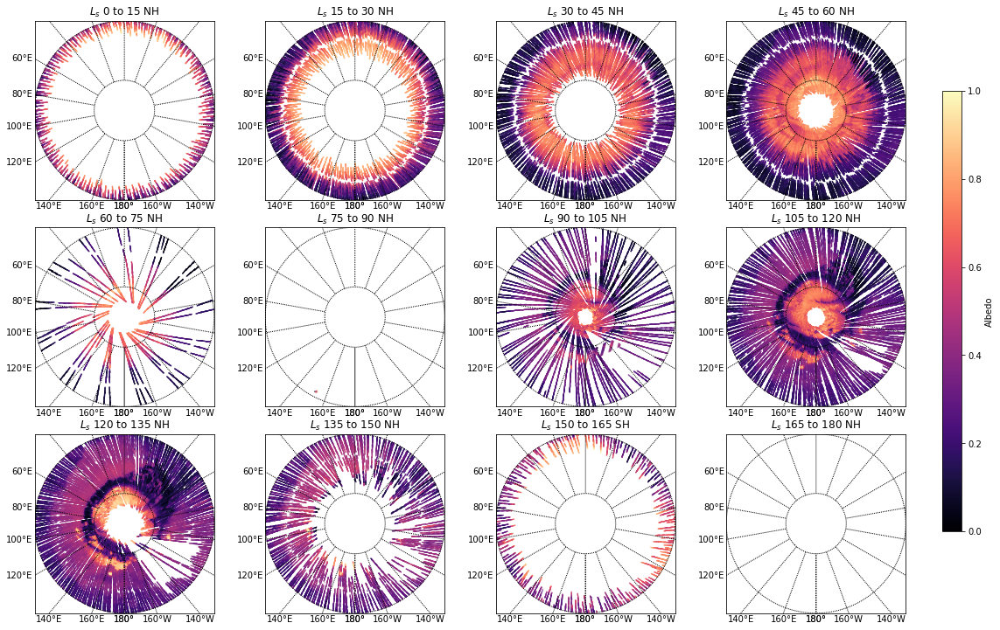

In [44]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb29N[1][0]),np.array(Alb29N[0][0]))
m.scatter(x,y,c=np.array(Alb29N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb29N[1][1]),np.array(Alb29N[0][1]))
m.scatter(x,y,c=np.array(Alb29N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb29N[1][2]),np.array(Alb29N[0][2]))
m.scatter(x,y,c=np.array(Alb29N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb29N[1][3]),np.array(Alb29N[0][3]))
m.scatter(x,y,c=np.array(Alb29N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb29N[1][4]),np.array(Alb29N[0][4]))
m.scatter(x,y,c=np.array(Alb29N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb29N[1][5]),np.array(Alb29N[0][5]))
m.scatter(x,y,c=np.array(Alb29N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb29N[1][6]),np.array(Alb29N[0][6]))
m.scatter(x,y,c=np.array(Alb29N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb29N[1][7]),np.array(Alb29N[0][7]))
m.scatter(x,y,c=np.array(Alb29N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb29N[1][8]),np.array(Alb29N[0][8]))
m.scatter(x,y,c=np.array(Alb29N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb29N[1][9]),np.array(Alb29N[0][9]))
m.scatter(x,y,c=np.array(Alb29N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 SH')
x,y = m(np.array(Alb29N[1][10]),np.array(Alb29N[0][10]))
m.scatter(x,y,c=np.array(Alb29N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb29N[1][11]),np.array(Alb29N[0][11]))
m.scatter(x,y,c=np.array(Alb29N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 30, JD2455131-2455818 (Northern Hemisphere)

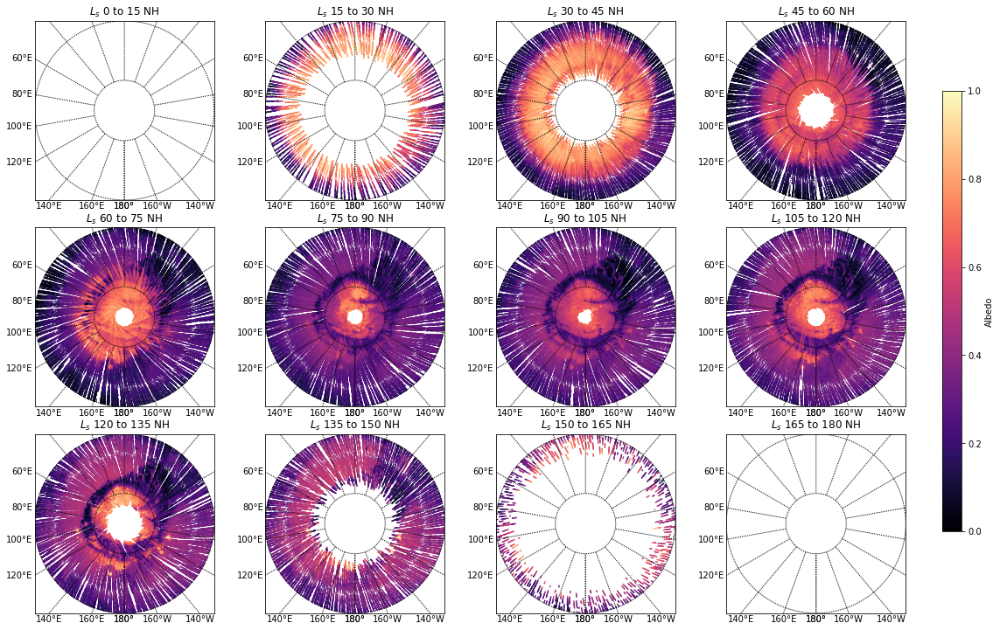

In [45]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb30N[1][0]),np.array(Alb30N[0][0]))
m.scatter(x,y,c=np.array(Alb30N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb30N[1][1]),np.array(Alb30N[0][1]))
m.scatter(x,y,c=np.array(Alb30N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb30N[1][2]),np.array(Alb30N[0][2]))
m.scatter(x,y,c=np.array(Alb30N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb30N[1][3]),np.array(Alb30N[0][3]))
m.scatter(x,y,c=np.array(Alb30N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb30N[1][4]),np.array(Alb30N[0][4]))
m.scatter(x,y,c=np.array(Alb30N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb30N[1][5]),np.array(Alb30N[0][5]))
m.scatter(x,y,c=np.array(Alb30N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb30N[1][6]),np.array(Alb30N[0][6]))
m.scatter(x,y,c=np.array(Alb30N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb30N[1][7]),np.array(Alb30N[0][7]))
m.scatter(x,y,c=np.array(Alb30N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb30N[1][8]),np.array(Alb30N[0][8]))
m.scatter(x,y,c=np.array(Alb30N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb30N[1][9]),np.array(Alb30N[0][9]))
m.scatter(x,y,c=np.array(Alb30N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb30N[1][10]),np.array(Alb30N[0][10]))
m.scatter(x,y,c=np.array(Alb30N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb30N[1][11]),np.array(Alb30N[0][11]))
m.scatter(x,y,c=np.array(Alb30N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 31, JD2455818-2456505 (Northern Hemisphere)

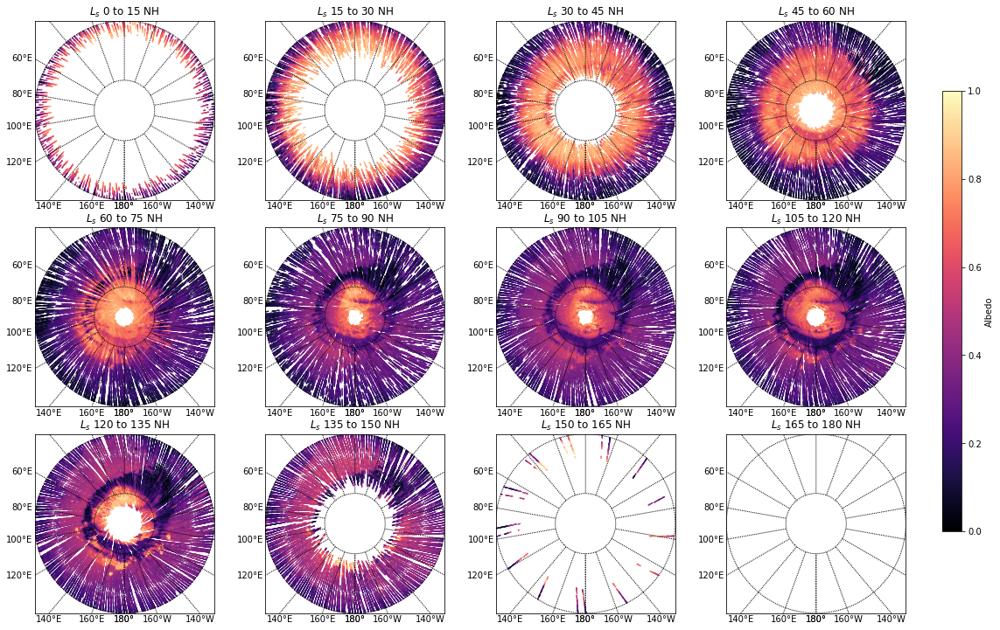

In [46]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb31N[1][0]),np.array(Alb31N[0][0]))
m.scatter(x,y,c=np.array(Alb31N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb31N[1][1]),np.array(Alb31N[0][1]))
m.scatter(x,y,c=np.array(Alb31N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb31N[1][2]),np.array(Alb31N[0][2]))
m.scatter(x,y,c=np.array(Alb31N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb31N[1][3]),np.array(Alb31N[0][3]))
m.scatter(x,y,c=np.array(Alb31N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb31N[1][4]),np.array(Alb31N[0][4]))
m.scatter(x,y,c=np.array(Alb31N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb31N[1][5]),np.array(Alb31N[0][5]))
m.scatter(x,y,c=np.array(Alb31N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb31N[1][6]),np.array(Alb31N[0][6]))
m.scatter(x,y,c=np.array(Alb31N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb31N[1][7]),np.array(Alb31N[0][7]))
m.scatter(x,y,c=np.array(Alb31N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb31N[1][8]),np.array(Alb31N[0][8]))
m.scatter(x,y,c=np.array(Alb31N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb31N[1][9]),np.array(Alb31N[0][9]))
m.scatter(x,y,c=np.array(Alb31N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb31N[1][10]),np.array(Alb31N[0][10]))
m.scatter(x,y,c=np.array(Alb31N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb31N[1][11]),np.array(Alb31N[0][11]))
m.scatter(x,y,c=np.array(Alb31N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 32, JD2456505-2457192 (Northern Hemisphere)

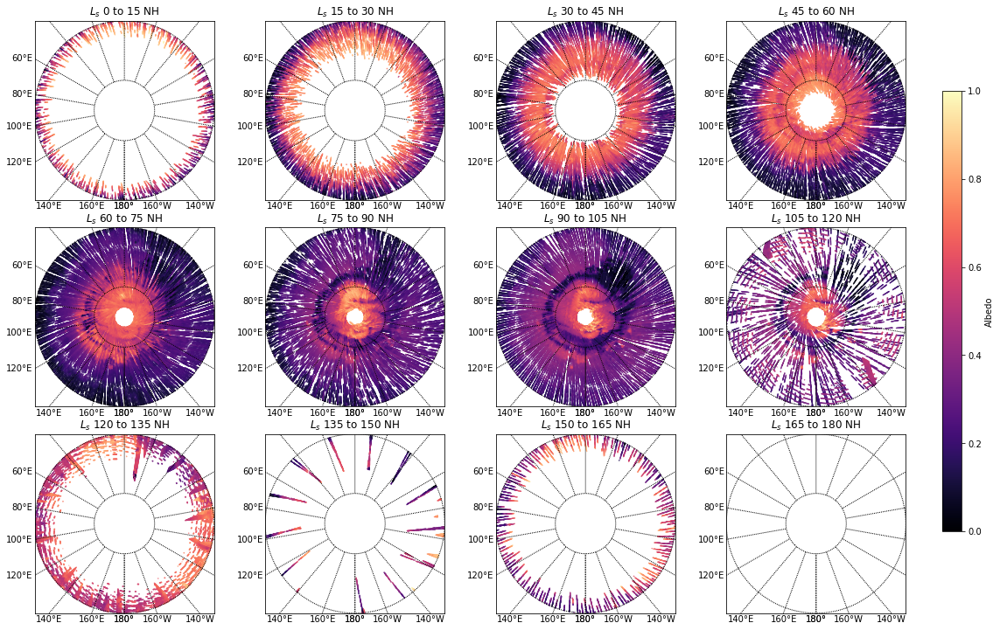

In [47]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb32N[1][0]),np.array(Alb32N[0][0]))
m.scatter(x,y,c=np.array(Alb32N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb32N[1][1]),np.array(Alb32N[0][1]))
m.scatter(x,y,c=np.array(Alb32N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb32N[1][2]),np.array(Alb32N[0][2]))
m.scatter(x,y,c=np.array(Alb32N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb32N[1][3]),np.array(Alb32N[0][3]))
m.scatter(x,y,c=np.array(Alb32N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb32N[1][4]),np.array(Alb32N[0][4]))
m.scatter(x,y,c=np.array(Alb32N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb32N[1][5]),np.array(Alb32N[0][5]))
m.scatter(x,y,c=np.array(Alb32N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb32N[1][6]),np.array(Alb32N[0][6]))
m.scatter(x,y,c=np.array(Alb32N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb32N[1][7]),np.array(Alb32N[0][7]))
m.scatter(x,y,c=np.array(Alb32N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb32N[1][8]),np.array(Alb32N[0][8]))
m.scatter(x,y,c=np.array(Alb32N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb32N[1][9]),np.array(Alb32N[0][9]))
m.scatter(x,y,c=np.array(Alb32N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb32N[1][10]),np.array(Alb32N[0][10]))
m.scatter(x,y,c=np.array(Alb32N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb32N[1][11]),np.array(Alb32N[0][11]))
m.scatter(x,y,c=np.array(Alb32N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 33,  JD2457192-2457879 (Northern Hemisphere)

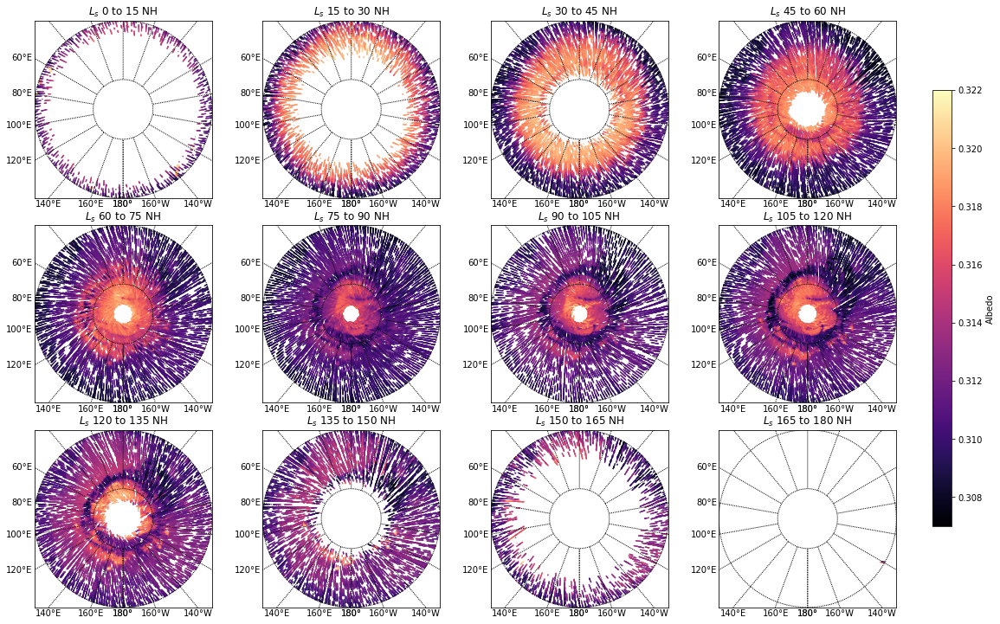

In [48]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 NH')
x,y = m(np.array(Alb33N[1][0]),np.array(Alb33N[0][0]))
m.scatter(x,y,c=np.array(Alb33N[2][0]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 NH')
x,y = m(np.array(Alb33N[1][1]),np.array(Alb33N[0][1]))
m.scatter(x,y,c=np.array(Alb33N[2][1]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 NH')
x,y = m(np.array(Alb33N[1][2]),np.array(Alb33N[0][2]))
m.scatter(x,y,c=np.array(Alb33N[2][2]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 NH')
x,y = m(np.array(Alb33N[1][3]),np.array(Alb33N[0][3]))
m.scatter(x,y,c=np.array(Alb33N[2][3]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 NH')
x,y = m(np.array(Alb33N[1][4]),np.array(Alb33N[0][4]))
m.scatter(x,y,c=np.array(Alb33N[2][4]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 NH')
x,y = m(np.array(Alb33N[1][5]),np.array(Alb33N[0][5]))
m.scatter(x,y,c=np.array(Alb33N[2][5]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 NH')
x,y = m(np.array(Alb33N[1][6]),np.array(Alb33N[0][6]))
m.scatter(x,y,c=np.array(Alb33N[2][6]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 NH')
x,y = m(np.array(Alb33N[1][7]),np.array(Alb33N[0][7]))
m.scatter(x,y,c=np.array(Alb33N[2][7]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 NH')
x,y = m(np.array(Alb33N[1][8]),np.array(Alb33N[0][8]))
m.scatter(x,y,c=np.array(Alb33N[2][8]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 NH')
x,y = m(np.array(Alb33N[1][9]),np.array(Alb33N[0][9]))
m.scatter(x,y,c=np.array(Alb33N[2][9]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 NH')
x,y = m(np.array(Alb33N[1][10]),np.array(Alb33N[0][10]))
m.scatter(x,y,c=np.array(Alb33N[2][10]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 NH')
x,y = m(np.array(Alb33N[1][11]),np.array(Alb33N[0][11]))
m.scatter(x,y,c=np.array(Alb33N[2][11]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 29, JD2454444-2455131 (Southern Hemisphere)

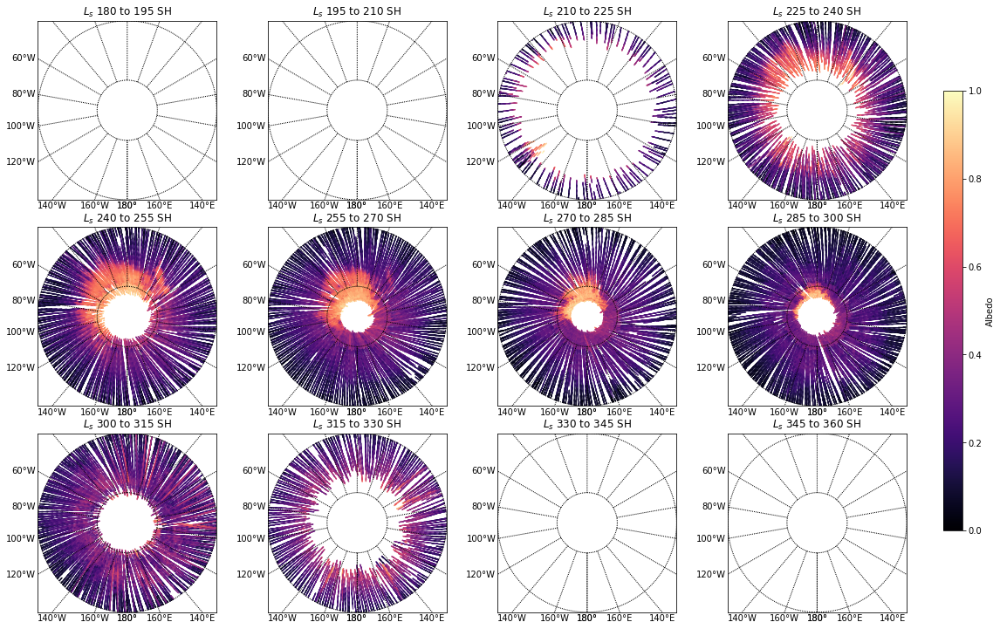

In [49]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb29S[1][12]),np.array(Alb29S[0][12]))
m.scatter(x,y,c=np.array(Alb29S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb29S[1][13]),np.array(Alb29S[0][13]))
m.scatter(x,y,c=np.array(Alb29S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb29S[1][14]),np.array(Alb29S[0][14]))
m.scatter(x,y,c=np.array(Alb29S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb29S[1][15]),np.array(Alb29S[0][15]))
m.scatter(x,y,c=np.array(Alb29S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb29S[1][16]),np.array(Alb29S[0][16]))
m.scatter(x,y,c=np.array(Alb29S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb29S[1][17]),np.array(Alb29S[0][17]))
m.scatter(x,y,c=np.array(Alb29S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb29S[1][18]),np.array(Alb29S[0][18]))
m.scatter(x,y,c=np.array(Alb29S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb29S[1][19]),np.array(Alb29S[0][19]))
m.scatter(x,y,c=np.array(Alb29S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb29S[1][20]),np.array(Alb29S[0][20]))
plt.title('${L_s}$ 300 to 315 SH')
m.scatter(x,y,c=np.array(Alb29S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb29S[1][21]),np.array(Alb29S[0][21]))
m.scatter(x,y,c=np.array(Alb29S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb29S[1][22]),np.array(Alb29S[0][22]))
m.scatter(x,y,c=np.array(Alb29S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=-180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb29S[1][23]),np.array(Alb29S[0][23]))
m.scatter(x,y,c=np.array(Alb29S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 30, JD2455131-2455818 (Southern Hemisphere)

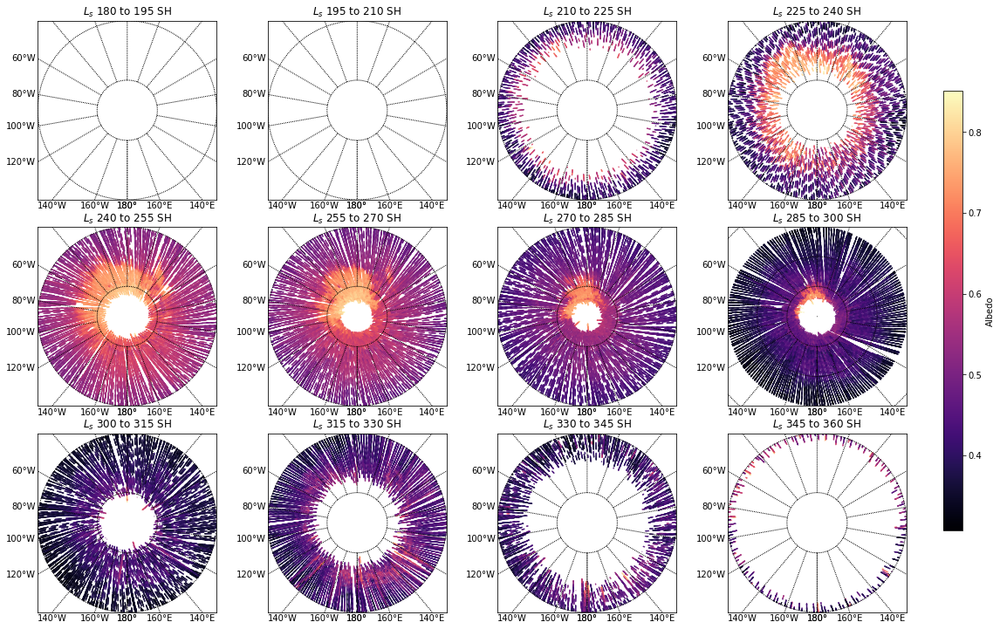

In [50]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb30S[1][12]),np.array(Alb30S[0][12]))
m.scatter(x,y,c=np.array(Alb30S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb30S[1][13]),np.array(Alb30S[0][13]))
m.scatter(x,y,c=np.array(Alb30S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb30S[1][14]),np.array(Alb30S[0][14]))
m.scatter(x,y,c=np.array(Alb30S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb30S[1][15]),np.array(Alb30S[0][15]))
m.scatter(x,y,c=np.array(Alb30S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb30S[1][16]),np.array(Alb30S[0][16]))
m.scatter(x,y,c=np.array(Alb30S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb30S[1][17]),np.array(Alb30S[0][17]))
m.scatter(x,y,c=np.array(Alb30S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb30S[1][18]),np.array(Alb30S[0][18]))
m.scatter(x,y,c=np.array(Alb30S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-90.,0.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb30S[1][19]),np.array(Alb30S[0][19]))
m.scatter(x,y,c=np.array(Alb30S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb30S[1][20]),np.array(Alb30S[0][20]))
plt.title('${L_s}$ 300 to 315 SH')
m.scatter(x,y,c=np.array(Alb30S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb30S[1][21]),np.array(Alb30S[0][21]))
m.scatter(x,y,c=np.array(Alb30S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb30S[1][22]),np.array(Alb30S[0][22]))
m.scatter(x,y,c=np.array(Alb30S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb30S[1][23]),np.array(Alb30S[0][23]))
m.scatter(x,y,c=np.array(Alb30S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 31, JD2455818-2456505 (Southern Hemisphere)

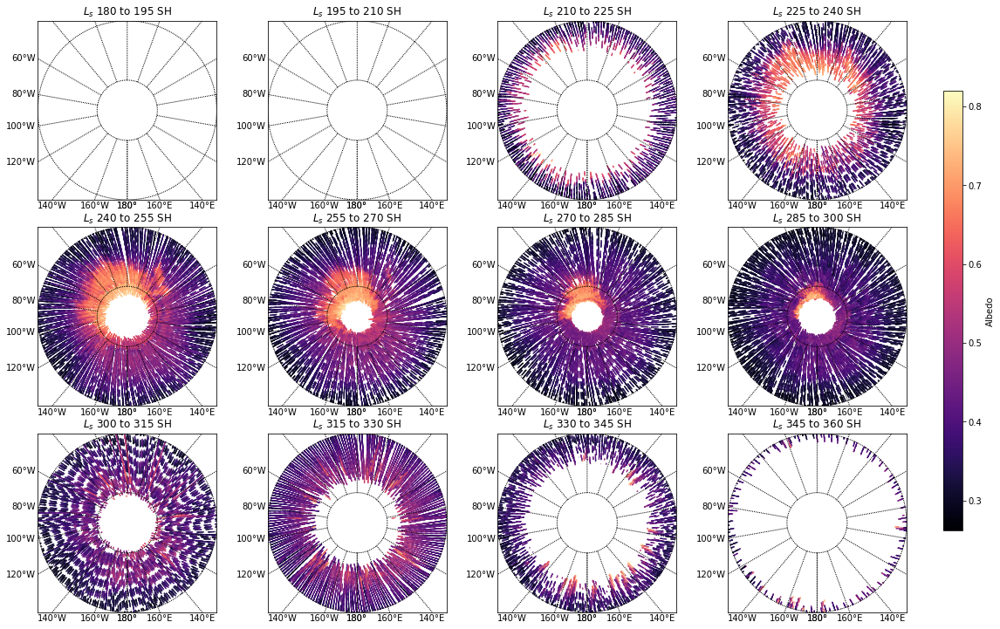

In [51]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb31S[1][12]),np.array(Alb31S[0][12]))
m.scatter(x,y,c=np.array(Alb31S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb31S[1][13]),np.array(Alb31S[0][13]))
m.scatter(x,y,c=np.array(Alb31S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb31S[1][14]),np.array(Alb31S[0][14]))
m.scatter(x,y,c=np.array(Alb31S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb31S[1][15]),np.array(Alb31S[0][15]))
m.scatter(x,y,c=np.array(Alb31S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb31S[1][16]),np.array(Alb31S[0][16]))
m.scatter(x,y,c=np.array(Alb31S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb31S[1][17]),np.array(Alb31S[0][17]))
m.scatter(x,y,c=np.array(Alb31S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb31S[1][18]),np.array(Alb31S[0][18]))
m.scatter(x,y,c=np.array(Alb31S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb31S[1][19]),np.array(Alb31S[0][19]))
m.scatter(x,y,c=np.array(Alb31S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb31S[1][20]),np.array(Alb31S[0][20]))
m.scatter(x,y,c=np.array(Alb31S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb31S[1][21]),np.array(Alb31S[0][21]))
m.scatter(x,y,c=np.array(Alb31S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb31S[1][22]),np.array(Alb31S[0][22]))
m.scatter(x,y,c=np.array(Alb31S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb31S[1][23]),np.array(Alb31S[0][23]))
m.scatter(x,y,c=np.array(Alb31S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 32, JD2456505-2457192 (Southern Hemisphere)

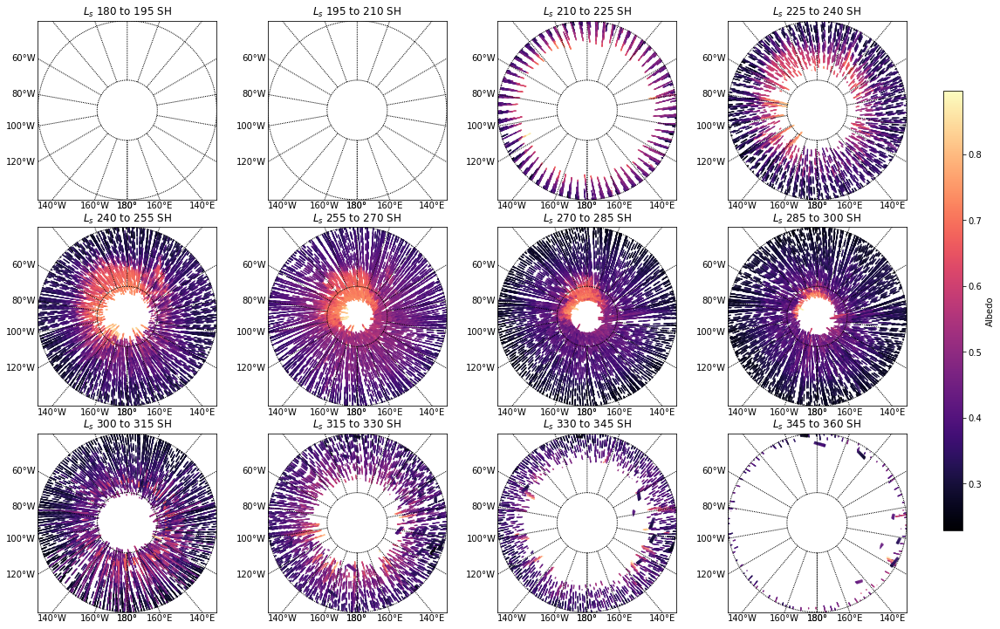

In [52]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb32S[1][13]),np.array(Alb32S[0][13]))
m.scatter(x,y,c=np.array(Alb32S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb32S[1][14]),np.array(Alb32S[0][14]))
m.scatter(x,y,c=np.array(Alb32S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb32S[1][15]),np.array(Alb32S[0][15]))
m.scatter(x,y,c=np.array(Alb32S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb32S[1][16]),np.array(Alb32S[0][16]))
m.scatter(x,y,c=np.array(Alb32S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb32S[1][17]),np.array(Alb32S[0][17]))
m.scatter(x,y,c=np.array(Alb32S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb32S[1][18]),np.array(Alb32S[0][18]))
m.scatter(x,y,c=np.array(Alb32S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb32S[1][19]),np.array(Alb32S[0][19]))
m.scatter(x,y,c=np.array(Alb32S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb32S[1][20]),np.array(Alb32S[0][20]))
m.scatter(x,y,c=np.array(Alb32S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb32S[1][21]),np.array(Alb32S[0][21]))
m.scatter(x,y,c=np.array(Alb32S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb32S[1][22]),np.array(Alb32S[0][22]))
m.scatter(x,y,c=np.array(Alb32S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb32S[1][23]),np.array(Alb32S[0][23]))
m.scatter(x,y,c=np.array(Alb32S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Polar Plots for Martian Year 33,  JD2457192-2457879 (Southern Hemisphere)

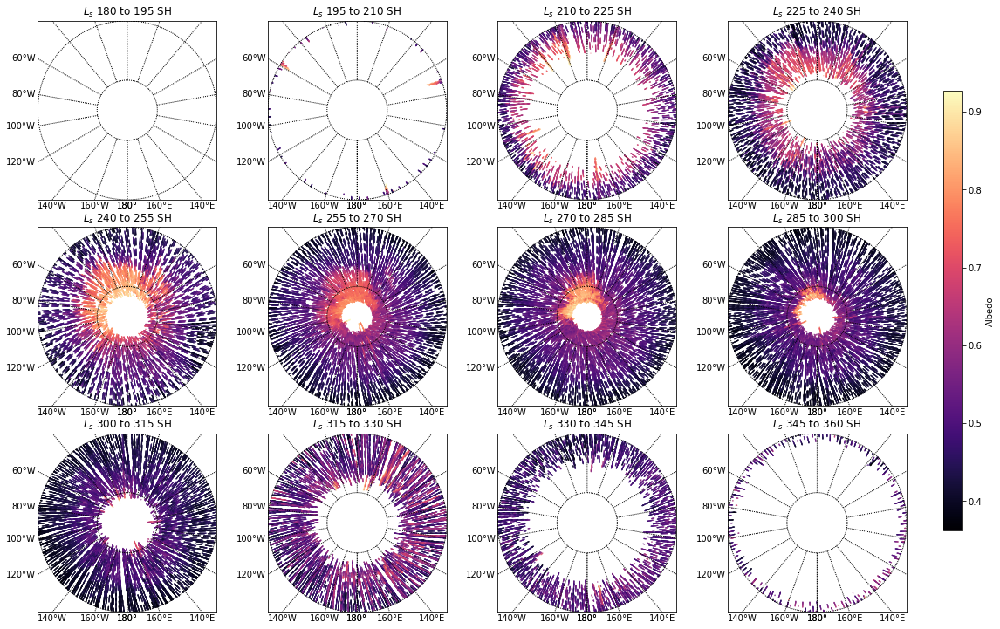

In [53]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
#Plotted each small array
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
x,y = m(np.array(Alb33S[1][12]),np.array(Alb33S[0][12]))
m.scatter(x,y,c=np.array(Alb33S[2][12]), cmap='magma', s= 0.05)
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
x,y = m(np.array(Alb33S[1][13]),np.array(Alb33S[0][13]))
m.scatter(x,y,c=np.array(Alb33S[2][13]), cmap='magma', s= 0.05)
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
x,y = m(np.array(Alb33S[1][14]),np.array(Alb33S[0][14]))
m.scatter(x,y,c=np.array(Alb33S[2][14]), cmap='magma', s= 0.05)
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
x,y = m(np.array(Alb33S[1][15]),np.array(Alb33S[0][15]))
m.scatter(x,y,c=np.array(Alb33S[2][15]), cmap='magma', s= 0.05)
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
x,y = m(np.array(Alb33S[1][16]),np.array(Alb33S[0][16]))
m.scatter(x,y,c=np.array(Alb33S[2][16]), cmap='magma', s= 0.05)
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
x,y = m(np.array(Alb33S[1][17]),np.array(Alb33S[0][17]))
m.scatter(x,y,c=np.array(Alb33S[2][17]), cmap='magma', s= 0.05)
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
x,y = m(np.array(Alb33S[1][18]),np.array(Alb33S[0][18]))
m.scatter(x,y,c=np.array(Alb33S[2][18]), cmap='magma', s= 0.05)
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
x,y = m(np.array(Alb33S[1][19]),np.array(Alb33S[0][19]))
m.scatter(x,y,c=np.array(Alb33S[2][19]), cmap='magma', s= 0.05)
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
x,y = m(np.array(Alb33S[1][20]),np.array(Alb33S[0][20]))
m.scatter(x,y,c=np.array(Alb33S[2][20]), cmap='magma', s= 0.05)
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
x,y = m(np.array(Alb33S[1][21]),np.array(Alb33S[0][21]))
m.scatter(x,y,c=np.array(Alb33S[2][21]), cmap='magma', s= 0.05)
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
x,y = m(np.array(Alb33S[1][22]),np.array(Alb33S[0][22]))
m.scatter(x,y,c=np.array(Alb33S[2][22]), cmap='magma', s= 0.05)
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
# draw parallels and meridians.
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
x,y = m(np.array(Alb33S[1][23]),np.array(Alb33S[0][23]))
m.scatter(x,y,c=np.array(Alb33S[2][23]), cmap='magma', s= 0.05)
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

# Median Calculation of each hemisphere

In [54]:
def poltocar(latlon, hemisphere, Manual = None, Lat = None, Lon = None):
    '''Function to convert Polar Coordinates into Cartesian
    Input:
    latlon: array containing the polar coordinates
    hemisphere: string to select hemisphere for conversion
    Output:
    x,y: arrays with Cartesian coordinates'''
    rad = np.pi/180
    if Manual == 'Y':
        if hemisphere == 'North' or hemisphere == 'north' or hemisphere == 'N' or hemisphere == 'n':
            R = []
            for i in Lat:
                R.append(2*(np.cos(((i+90)*rad)/2)))
        elif hemisphere == 'South' or hemisphere == 'south' or hemisphere == 'S' or hemisphere == 's':
            R = []
            for i in Lat:
                R.append(2*(np.cos(((90-i)*rad)/2)))
        R = np.array(R)
        e = []
        g = []
        for i in Lon:
            e.append((np.cos(i*rad)))
            g.append((np.sin(i*rad)))
        x = np.array(e)*R
        y = np.array(g)*R
    else:
        if hemisphere == 'North' or hemisphere == 'north' or hemisphere == 'N' or hemisphere == 'n':
            R = []
            for i in latlon[0]:
                R.append(2*(np.cos(((i+90)*rad)/2)))
        elif hemisphere == 'South' or hemisphere == 'south' or hemisphere == 'S' or hemisphere == 's':
            R = []
            for i in latlon[0]:
                R.append(2*(np.cos(((90-i)*rad)/2)))
        R = np.array(R)
        e = []
        g = []
        for i in latlon[1]:
            e.append((np.cos(i*rad)))
            g.append((np.sin(i*rad)))
        x = np.array(e)*R
        y = np.array(g)*R
    return x,y

In [55]:
CAlb29N = poltocar(Alb29N, 'N')
CAlb30N = poltocar(Alb30N, 'N')
CAlb31N = poltocar(Alb31N, 'N')
CAlb32N = poltocar(Alb32N, 'N')
CAlb33N = poltocar(Alb33N, 'N')

In [56]:
CAlb29S = poltocar(Alb29S, 'S')
CAlb30S = poltocar(Alb30S, 'S')
CAlb31S = poltocar(Alb31S, 'S')
CAlb32S = poltocar(Alb32S, 'S')
CAlb33S = poltocar(Alb33S, 'S')

In [57]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)

N29A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][0],CAlb29N[1][0], values = Alb29N[2][0], statistic='median' , bins = [xbins, ybins])
N31A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][0],CAlb31N[1][0], values = Alb31N[2][0], statistic='median' , bins = [xbins, ybins])
N32A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][0],CAlb32N[1][0], values = Alb32N[2][0], statistic='median' , bins = [xbins, ybins])
N33A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][0],CAlb33N[1][0], values = Alb33N[2][0], statistic='median' , bins = [xbins, ybins])

N29B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][1],CAlb29N[1][1], values = Alb29N[2][1], statistic='median' , bins = [xbins, ybins])
N30B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][1],CAlb30N[1][1], values = Alb30N[2][1], statistic='median' , bins = [xbins, ybins])
N31B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][1],CAlb31N[1][1], values = Alb31N[2][1], statistic='median' , bins = [xbins, ybins])
N32B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][1],CAlb32N[1][1], values = Alb32N[2][1], statistic='median' , bins = [xbins, ybins])
N33B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][1],CAlb33N[1][1], values = Alb33N[2][1], statistic='median' , bins = [xbins, ybins])

N29C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][2],CAlb29N[1][2], values = Alb29N[2][2], statistic='median' , bins = [xbins, ybins])
N30C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][2],CAlb30N[1][2], values = Alb30N[2][2], statistic='median' , bins = [xbins, ybins])
N31C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][2],CAlb31N[1][2], values = Alb31N[2][2], statistic='median' , bins = [xbins, ybins])
N32C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][2],CAlb32N[1][2], values = Alb32N[2][2], statistic='median' , bins = [xbins, ybins])
N33C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][2],CAlb33N[1][2], values = Alb33N[2][2], statistic='median' , bins = [xbins, ybins])

N29D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][3],CAlb29N[1][3], values = Alb29N[2][3], statistic='median' , bins = [xbins, ybins])
N30D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][3],CAlb30N[1][3], values = Alb30N[2][3], statistic='median' , bins = [xbins, ybins])
N31D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][3],CAlb31N[1][3], values = Alb31N[2][3], statistic='median' , bins = [xbins, ybins])
N32D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][3],CAlb32N[1][3], values = Alb32N[2][3], statistic='median' , bins = [xbins, ybins])
N33D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][3],CAlb33N[1][3], values = Alb33N[2][3], statistic='median' , bins = [xbins, ybins])

N29E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][4],CAlb29N[1][4], values = Alb29N[2][4], statistic='median' , bins = [xbins, ybins])
N30E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][4],CAlb30N[1][4], values = Alb30N[2][4], statistic='median' , bins = [xbins, ybins])
N31E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][4],CAlb31N[1][4], values = Alb31N[2][4], statistic='median' , bins = [xbins, ybins])
N32E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][4],CAlb32N[1][4], values = Alb32N[2][4], statistic='median' , bins = [xbins, ybins])
N33E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][4],CAlb33N[1][4], values = Alb33N[2][4], statistic='median' , bins = [xbins, ybins])

N29F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][5],CAlb29N[1][5], values = Alb29N[2][5], statistic='median' , bins = [xbins, ybins])
N30F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][5],CAlb30N[1][5], values = Alb30N[2][5], statistic='median' , bins = [xbins, ybins])
N31F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][5],CAlb31N[1][5], values = Alb31N[2][5], statistic='median' , bins = [xbins, ybins])
N32F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][5],CAlb32N[1][5], values = Alb32N[2][5], statistic='median' , bins = [xbins, ybins])
N33F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][5],CAlb33N[1][5], values = Alb33N[2][5], statistic='median' , bins = [xbins, ybins])

N29G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][6],CAlb29N[1][6], values = Alb29N[2][6], statistic='median' , bins = [xbins, ybins])
N30G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][6],CAlb30N[1][6], values = Alb30N[2][6], statistic='median' , bins = [xbins, ybins])
N31G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][6],CAlb31N[1][6], values = Alb31N[2][6], statistic='median' , bins = [xbins, ybins])
N32G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][6],CAlb32N[1][6], values = Alb32N[2][6], statistic='median' , bins = [xbins, ybins])
N33G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][6],CAlb33N[1][6], values = Alb33N[2][6], statistic='median' , bins = [xbins, ybins])

N29H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][7],CAlb29N[1][7], values = Alb29N[2][7], statistic='median' , bins = [xbins, ybins])
N30H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][7],CAlb30N[1][7], values = Alb30N[2][7], statistic='median' , bins = [xbins, ybins])
N31H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][7],CAlb31N[1][7], values = Alb31N[2][7], statistic='median' , bins = [xbins, ybins])
N32H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][7],CAlb32N[1][7], values = Alb32N[2][7], statistic='median' , bins = [xbins, ybins])
N33H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][7],CAlb33N[1][7], values = Alb33N[2][7], statistic='median' , bins = [xbins, ybins])

N29I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][8],CAlb29N[1][8], values = Alb29N[2][8], statistic='median' , bins = [xbins, ybins])
N30I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][8],CAlb30N[1][8], values = Alb30N[2][8], statistic='median' , bins = [xbins, ybins])
N31I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][8],CAlb31N[1][8], values = Alb31N[2][8], statistic='median' , bins = [xbins, ybins])
N32I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][8],CAlb32N[1][8], values = Alb32N[2][8], statistic='median' , bins = [xbins, ybins])
N33I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][8],CAlb33N[1][8], values = Alb33N[2][8], statistic='median' , bins = [xbins, ybins])

N29J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][9],CAlb29N[1][9], values = Alb29N[2][9], statistic='median' , bins = [xbins, ybins])
N30J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][9],CAlb30N[1][9], values = Alb30N[2][9], statistic='median' , bins = [xbins, ybins])
N31J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][9],CAlb31N[1][9], values = Alb31N[2][9], statistic='median' , bins = [xbins, ybins])
N32J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][9],CAlb32N[1][9], values = Alb32N[2][9], statistic='median' , bins = [xbins, ybins])
N33J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][9],CAlb33N[1][9], values = Alb33N[2][9], statistic='median' , bins = [xbins, ybins])

N29K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29N[0][10],CAlb29N[1][10], values = Alb29N[2][10], statistic='median' , bins = [xbins, ybins])
N30K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][10],CAlb30N[1][10], values = Alb30N[2][10], statistic='median' , bins = [xbins, ybins])
N31K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31N[0][10],CAlb31N[1][10], values = Alb31N[2][10], statistic='median' , bins = [xbins, ybins])
N32K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][10],CAlb32N[1][10], values = Alb32N[2][10], statistic='median' , bins = [xbins, ybins])
N33K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][10],CAlb33N[1][10], values = Alb33N[2][10], statistic='median' , bins = [xbins, ybins])


#N30L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30N[0][11],CAlb30N[1][11], values = Alb30N[2][11], statistic='median' , bins = [xbins, ybins])
#N32L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32N[0][11],CAlb32N[1][11], values = Alb32N[2][11], statistic='median' , bins = [xbins, ybins])
N33L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33N[0][11],CAlb33N[1][11], values = Alb33N[2][11], statistic='median' , bins = [xbins, ybins])

In [67]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
#S29A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][12],CAlb29S[1][12], values = Alb29S[2][12], statistic='median' , bins = [xbins, ybins])
#S30A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][12],CAlb30S[1][12], values = Alb30S[2][12], statistic='median' , bins = [xbins, ybins])
#S31A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][12],CAlb31S[1][12], values = Alb31S[2][12], statistic='median' , bins = [xbins, ybins])
#S32A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][12],CAlb32S[1][12], values = Alb32S[2][12], statistic='median' , bins = [xbins, ybins])
#S33A, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][12],CAlb33S[1][12], values = Alb33S[2][12], statistic='median' , bins = [xbins, ybins])


#S29B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][13],CAlb29S[1][13], values = Alb29S[2][13], statistic='median' , bins = [xbins, ybins])
#S30B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][13],CAlb30S[1][13], values = Alb30S[2][13], statistic='median' , bins = [xbins, ybins])
#S31B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][13],CAlb31S[1][13], values = Alb31S[2][13], statistic='median' , bins = [xbins, ybins])
#S32B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][13],CAlb32S[1][13], values = Alb32S[2][13], statistic='median' , bins = [xbins, ybins])
S33B, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][13],CAlb33S[1][13], values = Alb33S[2][13], statistic='median' , bins = [xbins, ybins])

S29C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][14],CAlb29S[1][14], values = Alb29S[2][14], statistic='median' , bins = [xbins, ybins])
S30C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][14],CAlb30S[1][14], values = Alb30S[2][14], statistic='median' , bins = [xbins, ybins])
S31C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][14],CAlb31S[1][14], values = Alb31S[2][14], statistic='median' , bins = [xbins, ybins])
S32C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][14],CAlb32S[1][14], values = Alb32S[2][14], statistic='median' , bins = [xbins, ybins])
S33C, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][14],CAlb33S[1][14], values = Alb33S[2][14], statistic='median' , bins = [xbins, ybins])

S29D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][15],CAlb29S[1][15], values = Alb29S[2][15], statistic='median' , bins = [xbins, ybins])
S30D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][15],CAlb30S[1][15], values = Alb30S[2][15], statistic='median' , bins = [xbins, ybins])
S31D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][15],CAlb31S[1][15], values = Alb31S[2][15], statistic='median' , bins = [xbins, ybins])
S32D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][15],CAlb32S[1][15], values = Alb32S[2][15], statistic='median' , bins = [xbins, ybins])
S33D, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][15],CAlb33S[1][15], values = Alb33S[2][15], statistic='median' , bins = [xbins, ybins])

S29E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][16],CAlb29S[1][16], values = Alb29S[2][16], statistic='median' , bins = [xbins, ybins])
S30E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][16],CAlb30S[1][16], values = Alb30S[2][16], statistic='median' , bins = [xbins, ybins])
S31E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][16],CAlb31S[1][16], values = Alb31S[2][16], statistic='median' , bins = [xbins, ybins])
S32E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][16],CAlb32S[1][16], values = Alb32S[2][16], statistic='median' , bins = [xbins, ybins])
S33E, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][16],CAlb33S[1][16], values = Alb33S[2][16], statistic='median' , bins = [xbins, ybins])

S29F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][17],CAlb29S[1][17], values = Alb29S[2][17], statistic='median' , bins = [xbins, ybins])
S30F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][17],CAlb30S[1][17], values = Alb30S[2][17], statistic='median' , bins = [xbins, ybins])
S31F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][17],CAlb31S[1][17], values = Alb31S[2][17], statistic='median' , bins = [xbins, ybins])
S32F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][17],CAlb32S[1][17], values = Alb32S[2][17], statistic='median' , bins = [xbins, ybins])
S33F, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][17],CAlb33S[1][17], values = Alb33S[2][17], statistic='median' , bins = [xbins, ybins])

S29G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][18],CAlb29S[1][18], values = Alb29S[2][18], statistic='median' , bins = [xbins, ybins])
S30G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][18],CAlb30S[1][18], values = Alb30S[2][18], statistic='median' , bins = [xbins, ybins])
S31G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][18],CAlb31S[1][18], values = Alb31S[2][18], statistic='median' , bins = [xbins, ybins])
S32G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][18],CAlb32S[1][18], values = Alb32S[2][18], statistic='median' , bins = [xbins, ybins])
S33G, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][18],CAlb33S[1][18], values = Alb33S[2][18], statistic='median' , bins = [xbins, ybins])

S29H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][19],CAlb29S[1][19], values = Alb29S[2][19], statistic='median' , bins = [xbins, ybins])
S30H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][19],CAlb30S[1][19], values = Alb30S[2][19], statistic='median' , bins = [xbins, ybins])
S31H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][19],CAlb31S[1][19], values = Alb31S[2][19], statistic='median' , bins = [xbins, ybins])
S32H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][19],CAlb32S[1][19], values = Alb32S[2][19], statistic='median' , bins = [xbins, ybins])
S33H, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][19],CAlb33S[1][19], values = Alb33S[2][19], statistic='median' , bins = [xbins, ybins])

S29I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][20],CAlb29S[1][20], values = Alb29S[2][20], statistic='median' , bins = [xbins, ybins])
S30I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][20],CAlb30S[1][20], values = Alb30S[2][20], statistic='median' , bins = [xbins, ybins])
S31I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][20],CAlb31S[1][20], values = Alb31S[2][20], statistic='median' , bins = [xbins, ybins])
S32I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][20],CAlb32S[1][20], values = Alb32S[2][20], statistic='median' , bins = [xbins, ybins])
S33I, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][20],CAlb33S[1][20], values = Alb33S[2][20], statistic='median' , bins = [xbins, ybins])

S29J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb29S[0][21],CAlb29S[1][21], values = Alb29S[2][21], statistic='median' , bins = [xbins, ybins])
S30J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][21],CAlb30S[1][21], values = Alb30S[2][21], statistic='median' , bins = [xbins, ybins])
S31J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][21],CAlb31S[1][21], values = Alb31S[2][21], statistic='median' , bins = [xbins, ybins])
S32J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][21],CAlb32S[1][21], values = Alb32S[2][21], statistic='median' , bins = [xbins, ybins])
S33J, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][21],CAlb33S[1][21], values = Alb33S[2][21], statistic='median' , bins = [xbins, ybins])

S30K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][22],CAlb30S[1][22], values = Alb30S[2][22], statistic='median' , bins = [xbins, ybins])
S31K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][22],CAlb31S[1][22], values = Alb31S[2][22], statistic='median' , bins = [xbins, ybins])
S32K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][22],CAlb32S[1][22], values = Alb32S[2][22], statistic='median' , bins = [xbins, ybins])
S33K, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][22],CAlb33S[1][22], values = Alb33S[2][22], statistic='median' , bins = [xbins, ybins])

S30L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb30S[0][23],CAlb30S[1][23], values = Alb30S[2][23], statistic='median' , bins = [xbins, ybins])
S31L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb31S[0][23],CAlb31S[1][23], values = Alb31S[2][23], statistic='median' , bins = [xbins, ybins])
S32L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb32S[0][23],CAlb32S[1][23], values = Alb32S[2][23], statistic='median' , bins = [xbins, ybins])
S33L, xedges, yedges, binnumber = stats.binned_statistic_2d(CAlb33S[0][23],CAlb33S[1][23], values = Alb33S[2][23], statistic='median' , bins = [xbins, ybins])

ValueError: zero-size array to reduction operation minimum which has no identity

In [59]:
def medianstack(*args): 
    x = np.dstack((args))
    np.shape(x)
    y = np.nanmedian(x, axis=2)
    return y
def meanstack(*args): 
    x = np.dstack((args))
    np.shape(x)
    y = np.nanmean(x, axis=2)
    return y

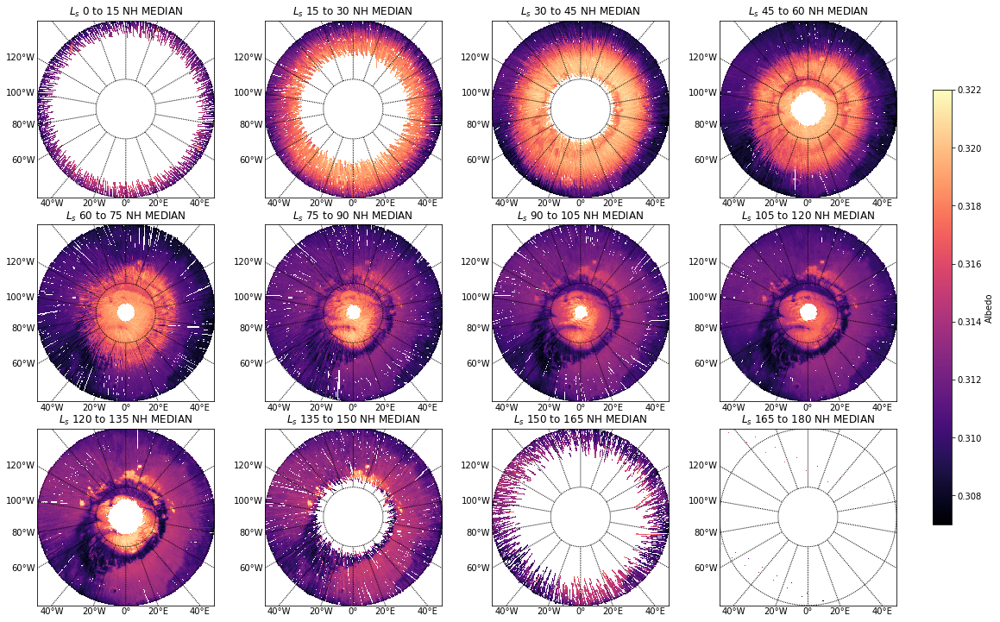

In [62]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29A,N31A,N33A), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 0 to 15 NH MEDIAN')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29B,N30B,N31B,N33B), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 15 to 30 NH MEDIAN')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29C,N30C,N31C,N33C), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 30 to 45 NH MEDIAN')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29D,N30D,N31D,N33D), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 45 to 60 NH MEDIAN')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29E,N30E,N31E,N33E), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 60 to 75 NH MEDIAN')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29F,N30F,N31F,N33F), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 75 to 90 NH MEDIAN')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29G,N30G,N31G,N33G), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 90 to 105 NH MEDIAN')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29H,N30H,N31H,N33H), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 105 to 120 NH MEDIAN')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29I,N30I,N31I,N33I), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 120 to 135 NH MEDIAN')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29J,N30J,N31J,N33J), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 135 to 150 NH MEDIAN')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N29K,N30K,N31K,N33K), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 150 to 165 NH MEDIAN')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(medianstack(N33L), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 165 to 180 NH MEDIAN')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo')
plt.show()

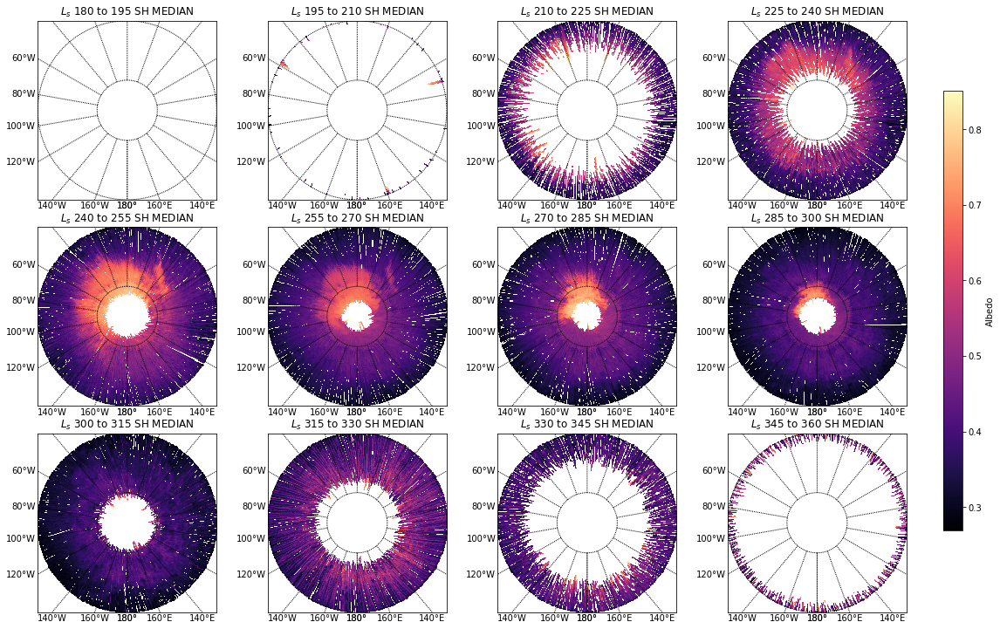

In [68]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH MEDIAN')
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S33B),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH MEDIAN')
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29C,S30C,S31C,S33C),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH MEDIAN')
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29D,S30D,S31D,S33D),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH MEDIAN')
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29E,S30E,S31E,S33E),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH MEDIAN')
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29F,S30F,S31F,S33F),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH MEDIAN')
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29G,S30G,S31G,S33G),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH MEDIAN')
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29H,S30H,S31H,S33H),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH MEDIAN')
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29I,S30I,S31I,S33I),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH MEDIAN')
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S29J,S30J,S31J,S33J),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH MEDIAN')
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S30K,S31K,S33K),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH MEDIAN')
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(medianstack(S30L,S31L,S33L),cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH MEDIAN')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Albedo') 
plt.show()

In [69]:
def emi(IR, FPT):
    '''Function to calculate emissivity using frost point temperature and infrared flux
    Input:
    IR - Infrared Array
    FPT - Frost Point Temperature
    Output:
    e- emissivity array'''
    x = 5.67e-8*(FPT**4)
    e = IR/x
    return e

In [70]:
def binreduce(emi, alb):
    '''function to find bins in albedo mapr that match the emissivity bins
    Input:
    emi - Emissivity Array
    alb - Albedo Array
    Output:
    emi - Matching Emissivity Array
    alb - Matching Albedo Array'''
    emi = pd.DataFrame(emi)
    alb = pd.DataFrame(alb)
    matchemi = emi.mask(alb.isnull())
    matchalb = alb.mask(emi.isnull())
    return matchemi, matchalb     

In [71]:
df = pd.read_csv('../WORK/surf_bT_ret_171031.txt', header=None, delimiter=r"\s+", names = [' ', 'UTC', 'MY', 'L_s', 'LTST', 'Surf_lat', 'Surf_lon', 'Surf_rad', 'Surf_elev', 'T_surf', 'T_surf_err', 'Dust_column', 'Dust_column_err', 'H2Oice_column', 'H2Oice_column_err', 'p_surf', 'p_surf_err', 'P_qual', 'T_qual'])
#read data into dataframe

In [72]:
df['Sol'] = ls2sol(df['L_s'],8)
dfday = df[df['LTST'] >= .5]
dfnight = df[df['LTST'] <= .5]

In [73]:
cond = (df['MY'],df['L_s'],pco2(df['T_surf']), df['p_surf'], tco2(df['p_surf']), df['p_surf_err'], df['T_surf'], df['LTST'], df['Surf_lat'], df['Surf_lon'], df['Dust_column'] , df['Sol'] )
cond_right= np.transpose(cond)
CO2 = pd.DataFrame(list(cond_right))
CO2.columns = ['MY','L_s','Eq_Vap_P','p_surf','Frost_T','p_err','T_surf','LTST', 'Surf_lat', 'Surf_lon', 'Dust_column', 'Sol']

In [74]:
CO2['p_err'] = CO2['p_err'].where(CO2['p_err'] > 0, 0)

In [75]:
newCO2 = CO2[(CO2['Eq_Vap_P'] <= (CO2['p_surf']+CO2['p_err'] )) & (CO2['MY'] > 28.0) & (CO2['MY'] <34.0)] 

In [76]:
CO2day = newCO2[newCO2['LTST'] >= 0.5]

In [77]:
SubCO2DayN = SubEmiDict(CO2day, L_sStep = 15.0, RanLat=[60.0,90.0])
SubCO2DayS = SubEmiDict(CO2day, L_sStep = 15.0, RanLat=[-90.0,-60.0])

In [78]:
SubnewNorth = SubEmiDict(newCO2, L_sStep = 15.0, RanLat=[60.0,90.0])
SubnewSouth = SubEmiDict(newCO2, L_sStep = 15.0, RanLat=[-90.0,-60.0])

In [79]:
CO2DayN = DataEmi(SubCO2DayN)
CO2DayS = DataEmi(SubCO2DayS)

In [80]:
newCO2N = DataEmi(SubnewNorth)
newCO2S = DataEmi(SubnewSouth)

In [81]:
del(SubCO2DayN,SubCO2DayS,SubnewNorth,SubnewSouth)

In [82]:
CO2EAN = poltocar(CO2DayN, 'N')
CO2EAS = poltocar(CO2DayS, 'S')

In [83]:
NEWEAN = poltocar(newCO2N, 'N')
NEWEAS = poltocar(newCO2S, 'S')

In [84]:
def center(Series, Stype):
    newpoint1 = pd.Series([-0.5])
    newpoint2 = pd.Series([0.5])
    newpoint3 = pd.Series([0])
    if Stype == 'loc':
        Series = Series.append(newpoint1)
        Series = Series.append(newpoint2)
    elif Stype == 'IR':
        Series = Series.append(newpoint3)
        Series = Series.append(newpoint3)
    return Series

In [85]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)

NIR0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[1][0], 'loc'), center(CO2EAN[0][0], 'loc'), values = center(CO2DayN[4][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR1, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][1], 'loc'), center(CO2EAN[1][1], 'loc'), values = center(CO2DayN[4][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR2, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][2], 'loc'), center(CO2EAN[1][2], 'loc'), values = center(CO2DayN[4][2], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR3, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][3], 'loc'), center(CO2EAN[1][3], 'loc'), values = center(CO2DayN[4][3], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR4, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][4], 'loc'), center(CO2EAN[1][4], 'loc'), values = center(CO2DayN[4][4], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR5, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][5], 'loc'), center(CO2EAN[1][5], 'loc'), values = center(CO2DayN[4][5], 'IR'), statistic='mean' , bins = [xbins, ybins])
#NIR6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][6], CO2EAN[1][6], values = CO2DayN[4][6], statistic='mean' , bins = [xbins, ybins])
#NIR7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][7], CO2EAN[1][7], values = CO2DayN[4][7], statistic='mean' , bins = [xbins, ybins])
#NIR8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][8], CO2EAN[1][8], values = CO2DayN[4][8], statistic='mean' , bins = [xbins, ybins])
#NIR9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][9], CO2EAN[1][9], values = CO2DayN[4][9], statistic='mean' , bins = [xbins, ybins])
#NIR10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][10], CO2EAN[1][10], values = CO2DayN[4][10], statistic='mean' , bins = [xbins, ybins])
#NIR11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][11], CO2EAN[1][11], values = CO2DayN[4][11], statistic='mean' , bins = [xbins, ybins])
NIR12, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][12], 'loc'), center(NEWEAN[1][12], 'loc'), values = center(newCO2N[4][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR13, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][13], 'loc'), center(NEWEAN[1][13], 'loc'), values = center(newCO2N[4][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR14, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][14], 'loc'), center(NEWEAN[1][14], 'loc'), values = center(newCO2N[4][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR15, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][15], 'loc'), center(NEWEAN[1][15], 'loc'), values = center(newCO2N[4][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR16, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][16], 'loc'), center(NEWEAN[1][16], 'loc'), values = center(newCO2N[4][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR17, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][17], 'loc'), center(NEWEAN[1][17], 'loc'), values = center(newCO2N[4][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR18, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][18], 'loc'), center(NEWEAN[1][18], 'loc'), values = center(newCO2N[4][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR19, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][19], 'loc'), center(NEWEAN[1][19], 'loc'), values = center(newCO2N[4][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR20, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][20], 'loc'), center(NEWEAN[1][20], 'loc'), values = center(newCO2N[4][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR21, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][21], 'loc'), center(NEWEAN[1][21], 'loc'), values = center(newCO2N[4][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR22, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][22], 'loc'), center(NEWEAN[1][22], 'loc'), values = center(newCO2N[4][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
NIR23, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][23], 'loc'), center(NEWEAN[1][23], 'loc'), values = center(newCO2N[4][23], 'IR'), statistic='mean' , bins = [xbins, ybins])

NFPT0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][0], 'loc'), center(CO2EAN[1][0], 'loc'), values = center(CO2DayN[5][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT1, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][1], 'loc'), center(CO2EAN[1][1], 'loc'), values = center(CO2DayN[5][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT2, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][2], 'loc'), center(CO2EAN[1][2], 'loc'), values = center(CO2DayN[5][2], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT3, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][3], 'loc'), center(CO2EAN[1][3], 'loc'), values = center(CO2DayN[5][3], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT4, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][4], 'loc'), center(CO2EAN[1][4], 'loc'), values = center(CO2DayN[5][4], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT5, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAN[0][5], 'loc'), center(CO2EAN[1][5], 'loc'), values = center(CO2DayN[5][5], 'IR'), statistic='mean' , bins = [xbins, ybins])
#NFPT6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][6], CO2EAN[1][6], values = CO2DayN[5][6], statistic='mean' , bins = [xbins, ybins])
#NFPT7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][7], CO2EAN[1][7], values = CO2DayN[5][7], statistic='mean' , bins = [xbins, ybins])
#NFPT8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][8], CO2EAN[1][8], values = CO2DayN[5][8], statistic='mean' , bins = [xbins, ybins])
#NFPT9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][9], CO2EAN[1][9], values = CO2DayN[5][9], statistic='mean' , bins = [xbins, ybins])
#NFPT10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][10], CO2EAN[1][10], values = CO2DayN[5][10], statistic='mean' , bins = [xbins, ybins])
#NFPT11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAN[0][11], CO2EAN[1][11], values = CO2DayN[5][11], statistic='mean' , bins = [xbins, ybins])
NFPT12, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][12], 'loc'), center(NEWEAN[1][12], 'loc'), values = center(newCO2N[5][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT13, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][13], 'loc'), center(NEWEAN[1][13], 'loc'), values = center(newCO2N[5][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT14, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][14], 'loc'), center(NEWEAN[1][14], 'loc'), values = center(newCO2N[5][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT15, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][15], 'loc'), center(NEWEAN[1][15], 'loc'), values = center(newCO2N[5][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT16, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][16], 'loc'), center(NEWEAN[1][16], 'loc'), values = center(newCO2N[5][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT17, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][17], 'loc'), center(NEWEAN[1][17], 'loc'), values = center(newCO2N[5][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT18, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][18], 'loc'), center(NEWEAN[1][18], 'loc'), values = center(newCO2N[5][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT19, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][19], 'loc'), center(NEWEAN[1][19], 'loc'), values = center(newCO2N[5][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT20, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][20], 'loc'), center(NEWEAN[1][20], 'loc'), values = center(newCO2N[5][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT21, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][21], 'loc'), center(NEWEAN[1][21], 'loc'), values = center(newCO2N[5][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT22, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][22], 'loc'), center(NEWEAN[1][22], 'loc'), values = center(newCO2N[5][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
NFPT23, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAN[0][23], 'loc'), center(NEWEAN[1][23], 'loc'), values = center(newCO2N[5][23], 'IR'), statistic='mean' , bins = [xbins, ybins])


In [86]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)

SIR0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAS[0][0], 'loc'), center(CO2EAS[1][0], 'loc'), values = center(CO2DayS[4][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
SIR1, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAS[0][1], 'loc'), center(CO2EAS[1][1], 'loc'), values = center(CO2DayS[4][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
SIR2, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][2], CO2EAS[1][2], values = CO2DayS[4][2], statistic='mean' , bins = [xbins, ybins])
SIR3, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][3], CO2EAS[1][3], values = CO2DayS[4][3], statistic='mean' , bins = [xbins, ybins])
SIR4, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][4], CO2EAS[1][4], values = CO2DayS[4][4], statistic='mean' , bins = [xbins, ybins])
SIR5, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][5], CO2EAS[1][5], values = CO2DayS[4][5], statistic='mean' , bins = [xbins, ybins])
SIR6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][6], CO2EAS[1][6], values = CO2DayS[4][6], statistic='mean' , bins = [xbins, ybins])
SIR7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][7], CO2EAS[1][7], values = CO2DayS[4][7], statistic='mean' , bins = [xbins, ybins])
SIR8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][8], CO2EAS[1][8], values = CO2DayS[4][8], statistic='mean' , bins = [xbins, ybins])
SIR9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][9], CO2EAS[1][9], values = CO2DayS[4][9], statistic='mean' , bins = [xbins, ybins])
SIR10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][10], CO2EAS[1][10], values = CO2DayS[4][10], statistic='mean' , bins = [xbins, ybins])
SIR11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][11], CO2EAS[1][11], values = CO2DayS[4][11], statistic='mean' , bins = [xbins, ybins])
SIR12,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][12], 'loc'), center(NEWEAS[1][12], 'loc'), values = center(newCO2S[4][12],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR13,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][13], 'loc'), center(NEWEAS[1][13], 'loc'), values = center(newCO2S[4][13],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR14,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][14], 'loc'), center(NEWEAS[1][14], 'loc'), values = center(newCO2S[4][14],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR15,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][15], 'loc'), center(NEWEAS[1][15], 'loc'), values = center(newCO2S[4][15],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR16,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][16], 'loc'), center(NEWEAS[1][16], 'loc'), values = center(newCO2S[4][16],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR17,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][17], 'loc'), center(NEWEAS[1][17], 'loc'), values = center(newCO2S[4][17],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR18,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][18], 'loc'), center(NEWEAS[1][18], 'loc'), values = center(newCO2S[4][18],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR19,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][19], 'loc'), center(NEWEAS[1][19], 'loc'), values = center(newCO2S[4][19],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR20,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][20], 'loc'), center(NEWEAS[1][20], 'loc'), values = center(newCO2S[4][20],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR21,xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][21], 'loc'), center(NEWEAS[1][21], 'loc'), values = center(newCO2S[4][21],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR22, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][22], 'loc'), center(NEWEAS[1][22], 'loc'), values = center(newCO2S[4][22],'IR'), statistic='mean' , bins = [xbins, ybins])
SIR23, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][23], 'loc'), center(NEWEAS[1][23], 'loc'), values = center(newCO2S[4][23],'IR'), statistic='mean' , bins = [xbins, ybins])


SFPT0, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAS[0][0],'loc'), center(CO2EAS[1][0], 'loc'), values = center(CO2DayS[5][0], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT1, xedges, yedges, binnumber = stats.binned_statistic_2d(center(CO2EAS[0][1],'loc'), center(CO2EAS[1][1], 'loc'), values = center(CO2DayS[5][1], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT2, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][2], CO2EAS[1][2], values = CO2DayS[5][2], statistic='mean' , bins = [xbins, ybins])
SFPT3, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][3], CO2EAS[1][3], values = CO2DayS[5][3], statistic='mean' , bins = [xbins, ybins])
SFPT4, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][4], CO2EAS[1][4], values = CO2DayS[5][4], statistic='mean' , bins = [xbins, ybins])
SFPT5, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][5], CO2EAS[1][5], values = CO2DayS[5][5], statistic='mean' , bins = [xbins, ybins])
SFPT6, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][6], CO2EAS[1][6], values = CO2DayS[5][6], statistic='mean' , bins = [xbins, ybins])
SFPT7, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][7], CO2EAS[1][7], values = CO2DayS[5][7], statistic='mean' , bins = [xbins, ybins])
SFPT8, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][8], CO2EAS[1][8], values = CO2DayS[5][8], statistic='mean' , bins = [xbins, ybins])
SFPT9, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][9], CO2EAS[1][9], values = CO2DayS[5][9], statistic='mean' , bins = [xbins, ybins])
SFPT10, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][10], CO2EAS[1][10], values = CO2DayS[5][10], statistic='mean' , bins = [xbins, ybins])
SFPT11, xedges, yedges, binnumber = stats.binned_statistic_2d(CO2EAS[0][11], CO2EAS[1][11], values = CO2DayS[5][11], statistic='mean' , bins = [xbins, ybins])
SFPT12, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][12],'loc'), center(NEWEAS[1][12], 'loc'), values = center(newCO2S[5][12], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT13, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][13],'loc'), center(NEWEAS[1][13], 'loc'), values = center(newCO2S[5][13], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT14, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][14],'loc'), center(NEWEAS[1][14], 'loc'), values = center(newCO2S[5][14], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT15, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][15],'loc'), center(NEWEAS[1][15], 'loc'), values = center(newCO2S[5][15], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT16, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][16],'loc'), center(NEWEAS[1][16], 'loc'), values = center(newCO2S[5][16], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT17, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][17],'loc'), center(NEWEAS[1][17], 'loc'), values = center(newCO2S[5][17], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT18, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][18],'loc'), center(NEWEAS[1][18], 'loc'), values = center(newCO2S[5][18], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT19, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][19],'loc'), center(NEWEAS[1][19], 'loc'), values = center(newCO2S[5][19], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT20, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][20],'loc'), center(NEWEAS[1][20], 'loc'), values = center(newCO2S[5][20], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT21, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][21],'loc'), center(NEWEAS[1][21], 'loc'), values = center(newCO2S[5][21], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT22, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][22],'loc'), center(NEWEAS[1][22], 'loc'), values = center(newCO2S[5][22], 'IR'), statistic='mean' , bins = [xbins, ybins])
SFPT23, xedges, yedges, binnumber = stats.binned_statistic_2d(center(NEWEAS[0][23],'loc'), center(NEWEAS[1][23], 'loc'), values = center(newCO2S[5][23], 'IR'), statistic='mean' , bins = [xbins, ybins])

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


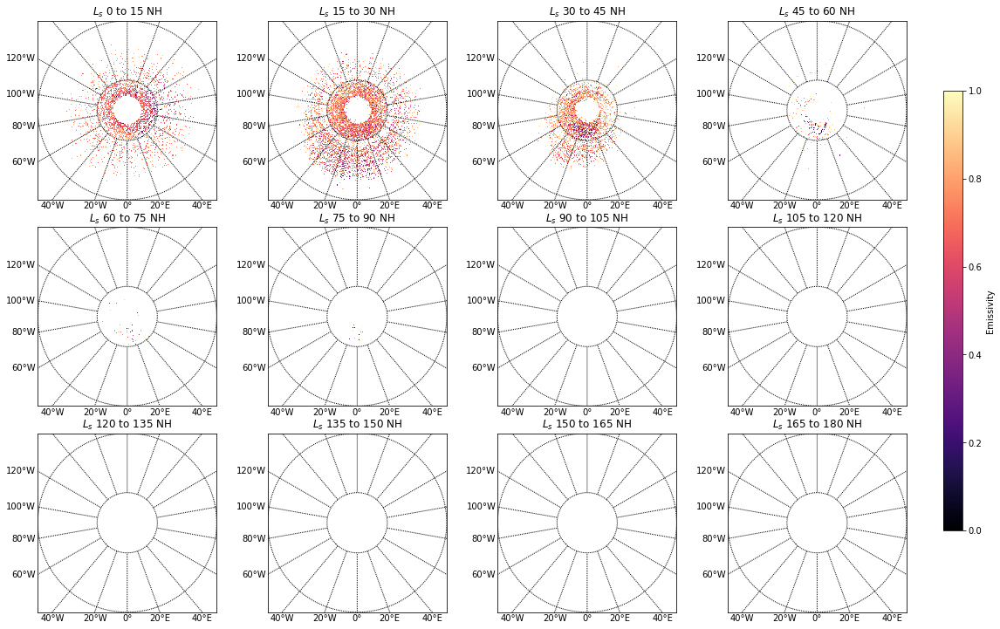

In [87]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR0,NFPT0), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 0 to 15 NH')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR1,NFPT1), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 15 to 30 NH')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR2,NFPT2), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 30 to 45 NH')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR3,NFPT3), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 45 to 60 NH')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR4,NFPT4), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 60 to 75 NH')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR5,NFPT5), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 75 to 90 NH')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 90 to 105 NH')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 105 to 120 NH')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 120 to 135 NH')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 135 to 150 NH')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 150 to 165 NH')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
x,y = m(np.array(Alb32S[1][12]),np.array(Alb32S[0][12]))
m.scatter(x,y,c=np.array(Alb32S[2][12]), cmap='magma', s= 0.05)
plt.title('${L_s}$ 165 to 180 NH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity')
plt.show()

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


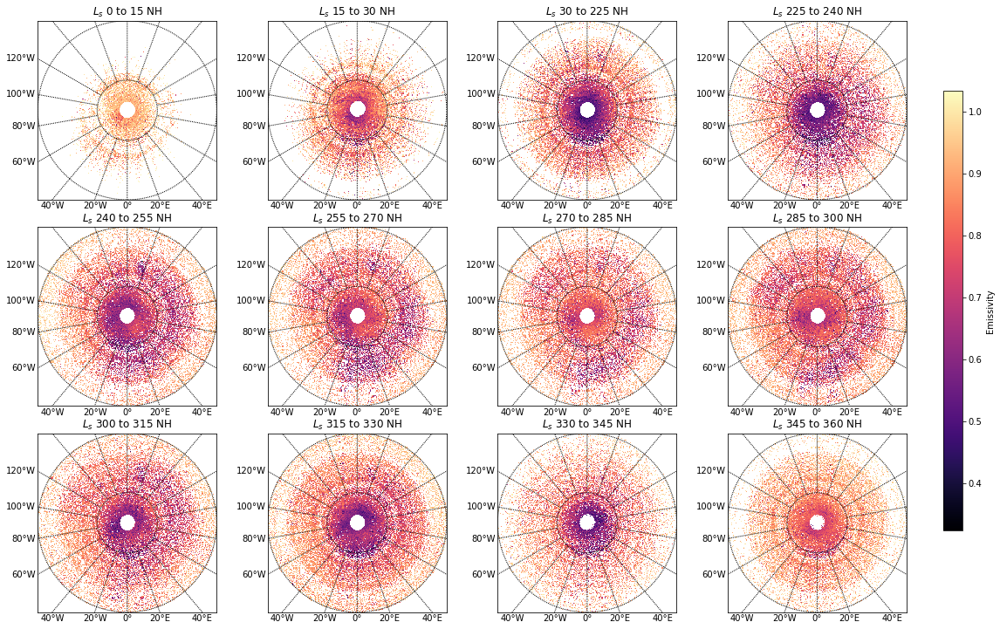

In [88]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR12,NFPT12), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 0 to 15 NH')
plt.sca(axes[0,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR13,NFPT13), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 15 to 30 NH')
plt.sca(axes[0,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR14,NFPT14), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 30 to 225 NH')
plt.sca(axes[0,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR15,NFPT15), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 225 to 240 NH')
plt.sca(axes[1,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR16,NFPT16), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 240 to 255 NH')
plt.sca(axes[1,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR17,NFPT17), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 255 to 270 NH')
plt.sca(axes[1,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR18,NFPT18), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 270 to 285 NH')
plt.sca(axes[1,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR19,NFPT19), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 285 to 300 NH')
plt.sca(axes[2,0])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR20,NFPT20), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 300 to 315 NH')
plt.sca(axes[2,1])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR21,NFPT21), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 315 to 330 NH')
plt.sca(axes[2,2])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR22,NFPT22), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 330 to 345 NH')
plt.sca(axes[2,3])
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(emi(NIR23,NFPT23), origin='upper', cmap = 'magma')
plt.title('${L_s}$ 345 to 360 NH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity')
plt.show()

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


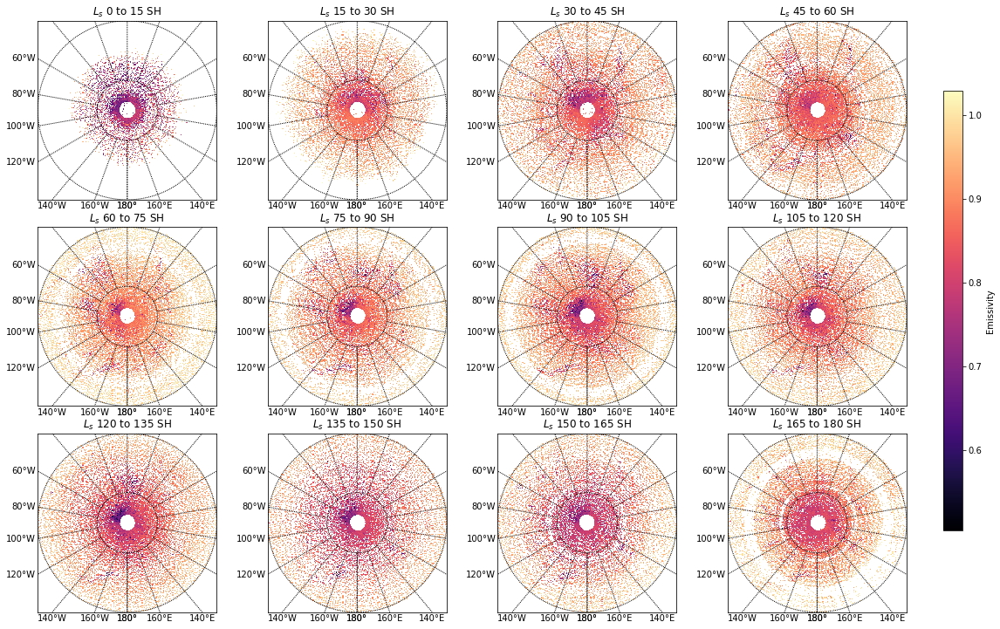

In [89]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR0,SFPT0), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 0 to 15 SH')
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR1,SFPT1), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 15 to 30 SH')
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR2,SFPT2), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 30 to 45 SH')
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR3,SFPT3), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 45 to 60 SH')
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR4,SFPT4), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 60 to 75 SH')
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR5,SFPT5), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 75 to 90 SH')
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR6,SFPT6), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 90 to 105 SH')
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR7,SFPT7), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 105 to 120 SH')
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR8,SFPT8), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 120 to 135 SH')
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR9,SFPT9), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 135 to 150 SH')
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR10,SFPT10), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 150 to 165 SH')
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR11,SFPT11), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 165 to 180 SH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity') 
plt.show()

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


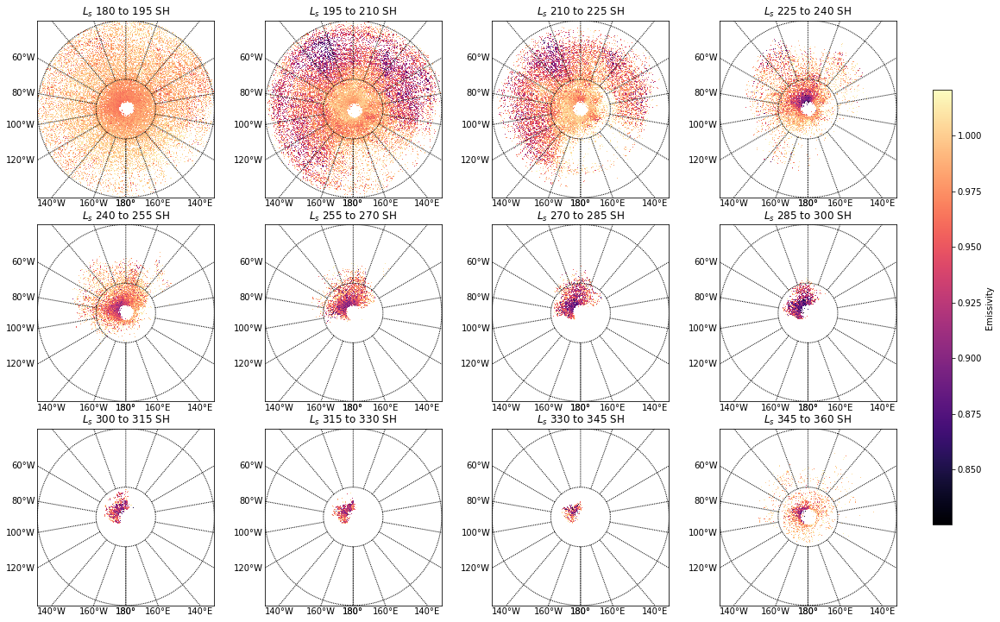

In [90]:
fig, axes = plt.subplots(3,4, sharex = False, sharey = False, figsize= (15,10))
plt.sca(axes[0,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR12,SFPT12), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 180 to 195 SH')
plt.sca(axes[0,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR13,SFPT13), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 195 to 210 SH')
plt.sca(axes[0,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR14,SFPT14), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 210 to 225 SH')
plt.sca(axes[0,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR15,SFPT15), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 225 to 240 SH')
plt.sca(axes[1,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR16,SFPT16), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 240 to 255 SH')
plt.sca(axes[1,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR17,SFPT17), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 255 to 270 SH')
plt.sca(axes[1,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR18,SFPT18), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 270 to 285 SH')
plt.sca(axes[1,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR19,SFPT19), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 285 to 300 SH')
plt.sca(axes[2,0])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR20,SFPT20), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 300 to 315 SH')
plt.sca(axes[2,1])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR21,SFPT21), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 315 to 330 SH')
plt.sca(axes[2,2])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR22,SFPT22), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 330 to 345 SH')
plt.sca(axes[2,3])
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.imshow(emi(SIR23,SFPT23), cmap = 'magma')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('${L_s}$ 345 to 360 SH')
plt.tight_layout()
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = plt.colorbar(cax=cbar_ax)
cbar.set_label('Emissivity') 
plt.show()

In [91]:
NLS0 =  binreduce(emi(NIR0,NFPT0),medianstack(N29A,N31A,N33A))
NLS15 = binreduce(emi(NIR1,NFPT1),medianstack(N29B,N30B,N31B,N33B))
NLS30 = binreduce(emi(NIR2,NFPT2),medianstack(N29C,N30C,N31C,N33C))
NLS45 = binreduce(emi(NIR3,NFPT3),medianstack(N29B,N30B,N31B,N33B))
NLS60 = binreduce(emi(NIR4,NFPT4),medianstack(N29D,N30D,N31D,N33D))
NLS75 = binreduce(emi(NIR5,NFPT5),medianstack(N29E,N30E,N31E,N33E))                 

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


In [92]:
NLS0A = np.array(NLS0[0])
NLS0B = np.array(NLS0[1])
NLS15A = np.array(NLS15[0])
NLS15B = np.array(NLS15[1])
NLS30A = np.array(NLS30[0])
NLS30B = np.array(NLS30[1])
NLS45A = np.array(NLS45[0])
NLS45B = np.array(NLS45[1])
NLS60A = np.array(NLS60[0])
NLS60B = np.array(NLS60[1])
NLS75A = np.array(NLS75[0])
NLS75B = np.array(NLS75[1])

In [93]:
NLS0A = NLS0A.flatten()
NLS0B = NLS0B.flatten()
NLS15A = NLS15A.flatten()
NLS15B = NLS15B.flatten()
NLS30A = NLS30A.flatten()
NLS30B = NLS30B.flatten()
NLS45A = NLS45A.flatten()
NLS45B = NLS45B.flatten()
NLS60A = NLS60A.flatten()
NLS60B = NLS60B.flatten()
NLS75A = NLS75A.flatten()
NLS75B = NLS75B.flatten()

In [94]:
NLS0A = NLS0A[np.logical_not(np.isnan(NLS0A))]
NLS0B = NLS0B[np.logical_not(np.isnan(NLS0B))]
NLS15A = NLS15A[np.logical_not(np.isnan(NLS15A))]
NLS15B = NLS15B[np.logical_not(np.isnan(NLS15B))]
NLS30A = NLS30A[np.logical_not(np.isnan(NLS30A))]
NLS30B = NLS30B[np.logical_not(np.isnan(NLS30B))]
NLS45A = NLS45A[np.logical_not(np.isnan(NLS45A))]
NLS45B = NLS45B[np.logical_not(np.isnan(NLS45B))]
NLS60A = NLS60A[np.logical_not(np.isnan(NLS60A))]
NLS60B = NLS60B[np.logical_not(np.isnan(NLS60B))]
NLS75A = NLS75A[np.logical_not(np.isnan(NLS75A))]
NLS75B = NLS75B[np.logical_not(np.isnan(NLS75B))]

In [95]:
N0 = np.concatenate((NLS0A,NLS15A,NLS30A,NLS45A,NLS60A,NLS75A))
N1 = np.concatenate((NLS0B,NLS15B,NLS30B,NLS45B,NLS60B,NLS75B))

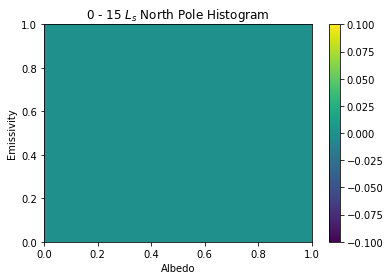

In [96]:
plt.hist2d(NLS0B,NLS0A, bins =[25,25])
plt.title('0 - 15 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

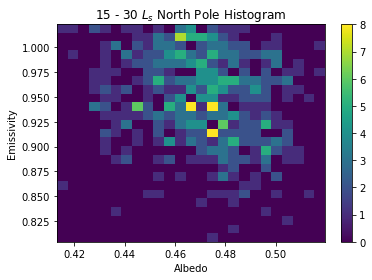

In [97]:
plt.hist2d(NLS15B,NLS15A, bins =[25,25])
plt.title('15 - 30 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

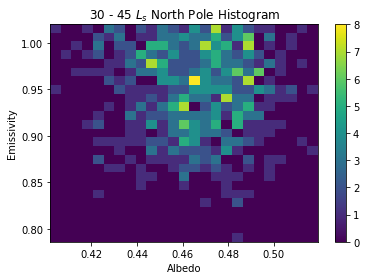

In [98]:
plt.hist2d(NLS30B,NLS30A, bins =[25,25])
plt.title('30 - 45 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

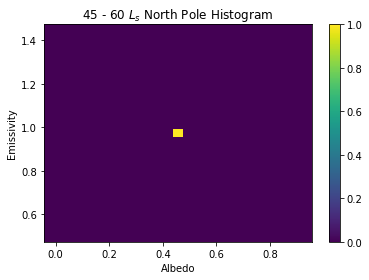

In [99]:
plt.hist2d(NLS45B,NLS45A, bins =[25,25])
plt.title('45 - 60 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

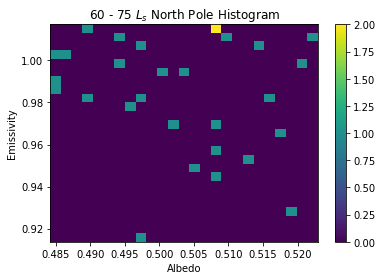

In [100]:
plt.hist2d(NLS60B,NLS60A, bins =[25,25])
plt.title('60 - 75 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

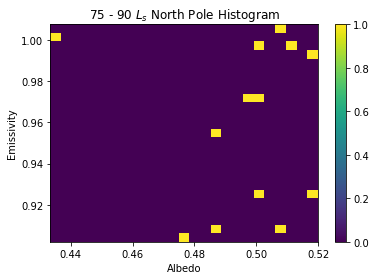

In [101]:
plt.hist2d(NLS75B,NLS75A, bins =[25,25])
plt.title('75 - 90 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

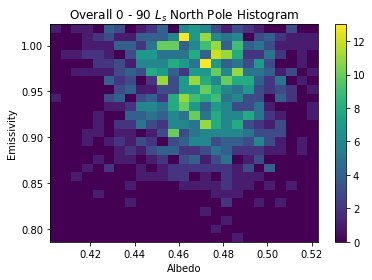

In [102]:
plt.hist2d(N1,N0, bins =[25,25])
plt.title('Overall 0 - 90 $L_s$ North Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

In [104]:
SLS195 = binreduce(emi(SIR13,SFPT13), medianstack(S33B))
SLS210 = binreduce(emi(SIR14,SFPT14), medianstack(S29C,S30C,S31C,S33C))
SLS225 = binreduce(emi(SIR15,SFPT15), medianstack(S29D,S30D,S31D,S33D))
SLS240 = binreduce(emi(SIR16,SFPT16), medianstack(S29E,S30E,S31E,S33E))
SLS255 = binreduce(emi(SIR17,SFPT17), medianstack(S29F,S30F,S31F,S33F))
SLS270 = binreduce(emi(SIR18,SFPT18), medianstack(S29G,S30G,S31G,S33G))
SLS285 = binreduce(emi(SIR19,SFPT19), medianstack(S29H,S30H,S31H,S33H))
SLS300 = binreduce(emi(SIR20,SFPT20), medianstack(S29I,S30I,S31I,S33I))
SLS315 = binreduce(emi(SIR21,SFPT21), medianstack(S29J,S30J,S31J,S33J))
SLS330 = binreduce(emi(SIR22,SFPT22), medianstack(S30K,S31K,S33K))                   

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':


In [105]:
SLS195A = np.array(SLS195[0])
SLS195B = np.array(SLS195[1])
SLS210A = np.array(SLS210[0])
SLS210B = np.array(SLS210[1])
SLS225A = np.array(SLS225[0])
SLS225B = np.array(SLS225[1])
SLS240A = np.array(SLS240[0])
SLS240B = np.array(SLS240[1])
SLS255A = np.array(SLS255[0])
SLS255B = np.array(SLS255[1])
SLS270A = np.array(SLS270[0])
SLS270B = np.array(SLS270[1])
SLS285A = np.array(SLS285[0])
SLS285B = np.array(SLS285[1])
SLS300A = np.array(SLS300[0])
SLS300B = np.array(SLS300[1])
SLS315A = np.array(SLS315[0])
SLS315B = np.array(SLS315[1])
SLS330A = np.array(SLS330[0])
SLS330B = np.array(SLS330[1])

In [106]:
SLS195A = SLS195A.flatten()
SLS195B = SLS195B.flatten()
SLS210A = SLS210A.flatten()
SLS210B = SLS210B.flatten()
SLS225A = SLS225A.flatten()
SLS225B = SLS225B.flatten()
SLS240A = SLS240A.flatten()
SLS240B = SLS240B.flatten()
SLS255A = SLS255A.flatten()
SLS255B = SLS255B.flatten()
SLS270A = SLS270A.flatten()
SLS270B = SLS270B.flatten()
SLS285A = SLS285A.flatten()
SLS285B = SLS285B.flatten()
SLS300A = SLS300A.flatten()
SLS300B = SLS300B.flatten()
SLS315A = SLS315A.flatten()
SLS315B = SLS315B.flatten()
SLS330A = SLS330A.flatten()
SLS330B = SLS330B.flatten() 

In [107]:
SLS195A = SLS195A[np.logical_not(np.isnan(SLS195A))]
SLS195B = SLS195B[np.logical_not(np.isnan(SLS195B))]
SLS210A = SLS210A[np.logical_not(np.isnan(SLS210A))]
SLS210B = SLS210B[np.logical_not(np.isnan(SLS210B))]
SLS225A = SLS225A[np.logical_not(np.isnan(SLS225A))]
SLS225B = SLS225B[np.logical_not(np.isnan(SLS225B))]
SLS240A = SLS240A[np.logical_not(np.isnan(SLS240A))]
SLS240B = SLS240B[np.logical_not(np.isnan(SLS240B))]
SLS255A = SLS255A[np.logical_not(np.isnan(SLS255A))]
SLS255B = SLS255B[np.logical_not(np.isnan(SLS255B))]
SLS270A = SLS270A[np.logical_not(np.isnan(SLS270A))]
SLS270B = SLS270B[np.logical_not(np.isnan(SLS270B))]
SLS285A = SLS285A[np.logical_not(np.isnan(SLS285A))]
SLS285B = SLS285B[np.logical_not(np.isnan(SLS285B))]
SLS300A = SLS300A[np.logical_not(np.isnan(SLS300A))]
SLS300B = SLS300B[np.logical_not(np.isnan(SLS300B))]
SLS315A = SLS315A[np.logical_not(np.isnan(SLS315A))]
SLS315B = SLS315B[np.logical_not(np.isnan(SLS315B))]
SLS330A = SLS330A[np.logical_not(np.isnan(SLS330A))]
SLS330B = SLS330B[np.logical_not(np.isnan(SLS330B))]

In [108]:
S0 = np.concatenate((SLS195A,SLS210A,SLS225A,SLS240A,SLS255A,SLS270A,SLS285A,SLS300A,SLS315A,SLS330A))
S1 = np.concatenate((SLS195B,SLS210B,SLS225B,SLS240B,SLS255B,SLS270B,SLS285B,SLS300B,SLS315B,SLS330B))

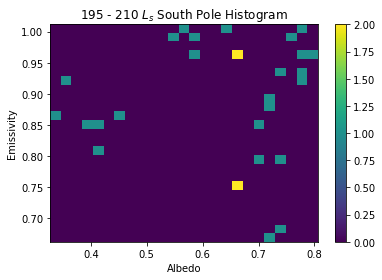

In [109]:
plt.hist2d(SLS195B,SLS195A, bins =[25,25])
plt.title('195 - 210 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

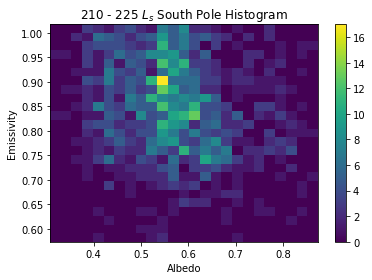

In [110]:
plt.hist2d(SLS210B,SLS210A, bins =[25,25])
plt.title('210 - 225 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

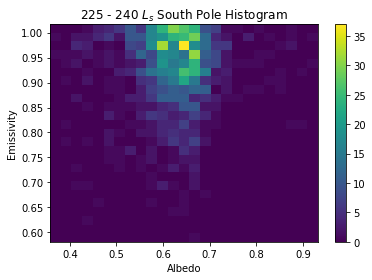

In [111]:
plt.hist2d(SLS225B,SLS225A, bins =[25,25])
plt.title('225 - 240 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

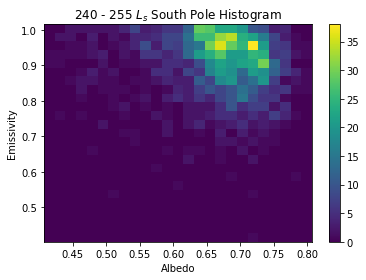

In [112]:
plt.hist2d(SLS240B,SLS240A, bins =[25,25])
plt.title('240 - 255 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

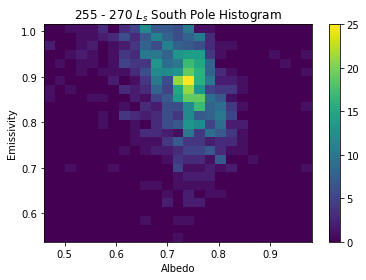

In [113]:
plt.hist2d(SLS255B,SLS255A, bins =[25,25])
plt.title('255 - 270 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

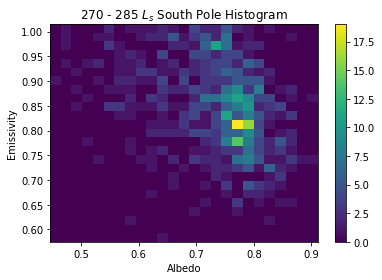

In [114]:
plt.hist2d(SLS270B,SLS270A, bins =[25,25])
plt.title('270 - 285 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

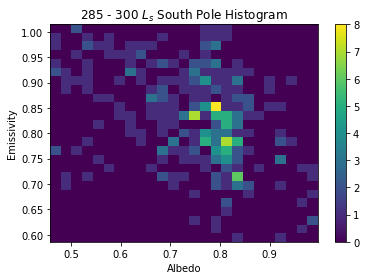

In [115]:
plt.hist2d(SLS285B,SLS285A, bins =[25,25])
plt.title('285 - 300 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

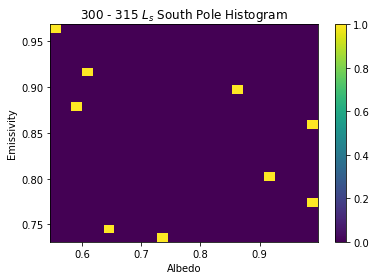

In [116]:
plt.hist2d(SLS300B,SLS300A, bins =[25,25])
plt.title('300 - 315 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

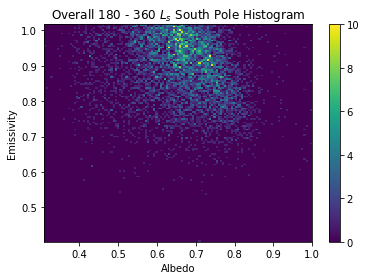

In [117]:
plt.hist2d(S1,S0, bins =[125,125])
plt.title('Overall 180 - 360 $L_s$ South Pole Histogram')
plt.xlabel('Albedo')
plt.ylabel('Emissivity')
plt.colorbar()
plt.show()

In [118]:
resolutions = 5
def adjustable_bins(Location ='South' , resolution=125):
    resolutions = resolution
    if Location == 'North':
        Location1 = N1
        Location0 = N0
        if resolution > 25:
            resolutions = 25
        LS1 = 0
        LS2 = 90
    if Location == 'South':
        Location1 = S1
        Location0 = S0
        LS1 = 180
        LS2 = 360
    plt.hist2d(Location1,Location0, bins =[resolutions,resolutions])
    plt.title('Overall {} - {} $L_s$ {} Pole Histogram'.format(LS1,LS2,Location))
    plt.xlabel('Albedo')
    plt.ylabel('Emissivity')
    plt.colorbar()
    plt.show()
interactive_plot = widgets.interactive(adjustable_bins, Location =['South', 'North'], resolution=(5,500,10))
interactive_plot

aW50ZXJhY3RpdmUoY2hpbGRyZW49KERyb3Bkb3duKGRlc2NyaXB0aW9uPXUnTG9jYXRpb24nLCBvcHRpb25zPSgnU291dGgnLCAnTm9ydGgnKSwgdmFsdWU9J1NvdXRoJyksIEludFNsaWRlcijigKY=


In [120]:
Ultimate_Albedo_North_3000 = meanstack(medianstack(N29A,N31A,N33A),medianstack(N29B,N30B,N31B,N33B),medianstack(N29C,N30C,N31C,N33C),
                                       medianstack(N29D,N30D,N31D,N33D),medianstack(N29E,N30E,N31E,N33E),medianstack(N29F,N30F,N31F,N33F),
                                       medianstack(N29G,N30G,N31G,N33G),medianstack(N29H,N30H,N31H,N33H),medianstack(N29I,N30I,N31I,N33I),
                                       medianstack(N29K,N30K,N31K,N33K),medianstack(N33L))

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


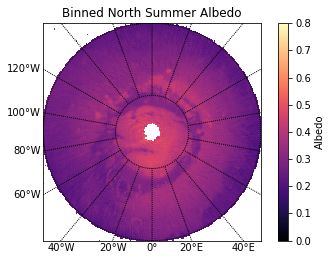

In [121]:
#
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Albedo_North_3000, cmap = 'magma', origin ='upper', vmin = 0.0, vmax = 0.8)
plt.title('Binned North Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [122]:
np.nanmean(Ultimate_Albedo_North_3000)

0.305394335440767

In [124]:
Ultimate_Albedo_South_3000 = meanstack(medianstack(S33B),medianstack(S29C,S30C,S31C,S33C),medianstack(S29D,S30D,S31D,S33D),
                                       medianstack(S29E,S30E,S31E,S33E),medianstack(S29F,S30F,S31F,S33F),medianstack(S29G,S30G,S31G,S33G),
                                       medianstack(S29H,S30H,S31H,S33H),medianstack(S29I,S30I,S31I,S33I),medianstack(S29J,S30J,S31J,S33J),
                                       medianstack(S30K,S31K,S33K),medianstack(S30L,S31L,S33L))

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


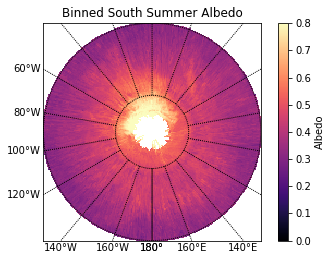

In [125]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Albedo_South_3000, cmap ='magma', vmin = 0.0, vmax = 0.8)
plt.title('Binned South Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [126]:
np.nanmean(Ultimate_Albedo_South_3000)

0.41622726924890674

In [127]:
def adjustable_alb(Location = 'North', minval =0.0, maxval = 1.0):
    if Location == 'North':
        if minval > .30:
            minval = .30
        m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
        m.drawparallels(np.arange(0.,91.,20.))
        m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Albedo_North_3000, cmap = 'magma', origin ='upper', vmin=minval, vmax =maxval)
        plt.title('Albedo in the North $L_s$ 0 - 180')
        cbar = plt.colorbar()
        cbar.set_label('Albedo')
        plt.show()
    if Location == 'South':
        m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
        m.drawparallels(np.arange(-80.,-40.,20.))
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Albedo_South_3000, cmap ='magma', vmin = minval, vmax = maxval)
        plt.title('Albedo in the North $L_s$ 180 - 360')
        cbar = plt.colorbar()
        cbar.set_label('Albedo')
        plt.show()
interactive_plot = widgets.interactive(adjustable_alb, Location =['South', 'North'], minval=(0.0,1.0,0.05), maxval=(0.0,1.0,0.05))
interactive_plot

aW50ZXJhY3RpdmUoY2hpbGRyZW49KERyb3Bkb3duKGRlc2NyaXB0aW9uPXUnTG9jYXRpb24nLCBpbmRleD0xLCBvcHRpb25zPSgnU291dGgnLCAnTm9ydGgnKSwgdmFsdWU9J05vcnRoJyksIEbigKY=


In [128]:
Ultimate_Emissivity_North_Winter_3000= meanstack(emi(NIR12,NFPT12),emi(NIR13,NFPT13),emi(NIR14,NFPT14),
                                                 emi(NIR15,NFPT15),emi(NIR16,NFPT16),emi(NIR17,NFPT17),
                                                 emi(NIR18,NFPT18),emi(NIR19,NFPT19),emi(NIR20,NFPT20),
                                                 emi(NIR21,NFPT21),emi(NIR22,NFPT22),emi(NIR23,NFPT23))

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':
/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


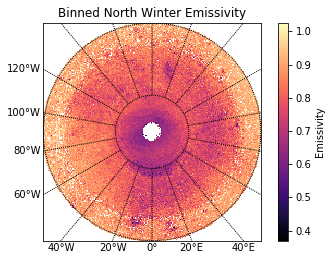

In [129]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Emissivity_North_Winter_3000, cmap = 'magma', origin = 'upper')
plt.title('Binned North Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [130]:
np.nanmean(Ultimate_Emissivity_North_Winter_3000)

0.82452614953582681

In [131]:
Ultimate_Emissivity_South_Winter_3000= meanstack(emi(SIR0,SFPT0),emi(SIR1,SFPT1),emi(SIR2,SFPT2),
                                                 emi(SIR3,SFPT3),emi(SIR4,SFPT4),emi(SIR5,SFPT5),
                                                 emi(SIR6,SFPT6),emi(SIR7,SFPT7),emi(SIR8,SFPT8),
                                                 emi(SIR9,SFPT9),emi(SIR10,SFPT10),emi(SIR11,SFPT11))

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in divide
  if __name__ == '__main__':
/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


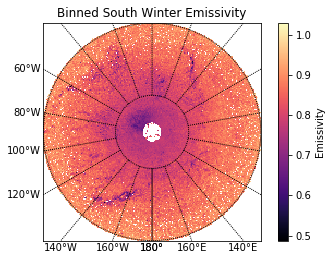

In [132]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(Ultimate_Emissivity_South_Winter_3000, cmap ='magma')
plt.title('Binned South Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [133]:
np.nanmean(Ultimate_Emissivity_South_Winter_3000)

0.8483872704698795

In [134]:
def adjustable_emi(Location = 'North', minval =0.0, maxval = 1.0):
    if Location == 'North':
        if minval > .30:
            minval = .30
        m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
        m.drawparallels(np.arange(0.,91.,20.))
        m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Emissivity_North_Winter_3000, cmap = 'magma', origin ='upper', vmin=minval, vmax =maxval)
        plt.title('Emissivity in the North $L_s$ 180-360')
        cbar = plt.colorbar()
        cbar.set_label('Emissivity')
        plt.show()
    if Location == 'South':
        m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
        m.drawparallels(np.arange(-80.,-40.,20.))
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
        m.imshow(Ultimate_Emissivity_South_Winter_3000, cmap ='magma', vmin = minval, vmax = maxval)
        plt.title('Emissivity in the South $L_s$ 0-180')
        cbar = plt.colorbar()
        cbar.set_label('Emissivity')
        plt.show()
interactive_plot = widgets.interactive(adjustable_emi, Location =['South', 'North'], minval=(0.0,1.0,0.05), maxval=(0.0,1.0,0.05))
interactive_plot

aW50ZXJhY3RpdmUoY2hpbGRyZW49KERyb3Bkb3duKGRlc2NyaXB0aW9uPXUnTG9jYXRpb24nLCBpbmRleD0xLCBvcHRpb25zPSgnU291dGgnLCAnTm9ydGgnKSwgdmFsdWU9J05vcnRoJyksIEbigKY=


In [135]:
NWICO2 = newCO2[(newCO2['L_s'] >= 180) & (newCO2['Surf_lat'] >= 60.0) & (newCO2['Surf_lat'] <= 90.0)]

In [136]:
SWICO2 = newCO2[(newCO2['L_s'] <= 180) & (newCO2['Surf_lat'] >= -90.0) & (newCO2['Surf_lat'] <= -60.0)]

In [137]:
NWIECoor = poltocar(NWICO2, 'N', 'Y', NWICO2['Surf_lat'], NWICO2['Surf_lon'])
SWIECoor = poltocar(SWICO2, 'S', 'Y', SWICO2['Surf_lat'], SWICO2['Surf_lon'])

In [138]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NWIIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIECoor[0], NWIECoor[1], values= (NWICO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWIIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIECoor[0], SWIECoor[1], values= (SWICO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWIFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIECoor[0], NWIECoor[1], values= (NWICO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWIFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIECoor[0], SWIECoor[1], values= (SWICO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])

In [139]:
NWIEmi = emi(IRFlux(NWIIR), NWIFPT)
SWIEmi = emi(IRFlux(SWIIR), SWIFPT)

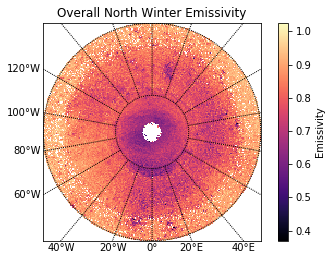

In [140]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWIEmi, cmap = 'magma', origin = 'upper')
plt.title('Overall North Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [141]:
np.nanmean(NWIEmi)

0.8198734351980852

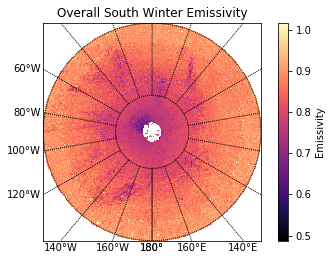

In [142]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWIEmi, cmap ='magma')
plt.title('Overall South Winter Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [143]:
np.nanmean(SWIEmi)

0.85635320839947637

In [144]:
NWICoor = poltocar(NAlb, 'N', 'Y', NAlb['Latitude'], NAlb['Longitude'])
SWICoor = poltocar(SAlb, 'S', 'Y', SAlb['Latitude'], SAlb['Longitude'])

In [145]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NALB, xedges, yedges, binnumber = stats.binned_statistic_2d(NWICoor[0], NWICoor[1], values= (NAlb['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALB, xedges, yedges, binnumber = stats.binned_statistic_2d(SWICoor[0], SWICoor[1], values= (SAlb['Albedo']), statistic ='mean', bins = [xbins, ybins])

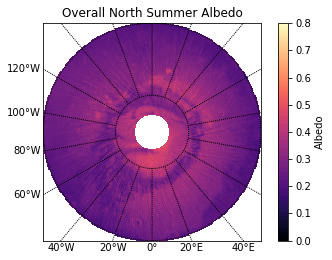

In [146]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALB, cmap = 'magma', origin ='upper', vmin = 0.0, vmax = 0.8)
plt.title('Overall North Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [147]:
np.nanmean(NALB)

0.28568511581825723

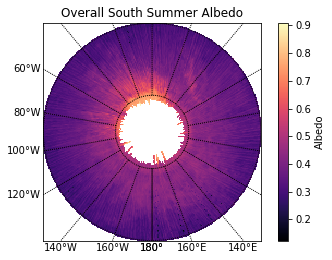

In [148]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
plt.title('Overall South Summer Albedo')
m.imshow(SALB, cmap ='magma')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [149]:
np.nanmean(SALB)

0.38417560905408749

In [150]:
NAlb0 = NLS0[1]
NAlb15 = NLS15[1]
NAlb30 = NLS30[1]
NAlb45 = NLS45[1]
NAlb60 = NLS60[1]
NAlb75 = NLS75[1]

In [151]:
NCO2Alb = meanstack(NAlb0, NAlb15,NAlb30,NAlb45,NAlb60,NAlb75)

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


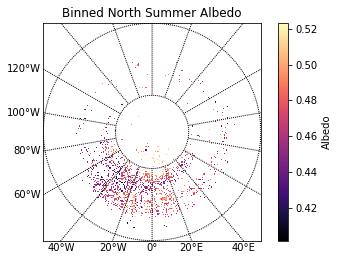

In [152]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NCO2Alb, origin='upper', cmap = 'magma')
plt.title('Binned North Summer Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo') 

In [153]:
SAlb195 = SLS195[1]
SAlb210 = SLS210[1]
SAlb225 = SLS225[1]
SAlb240 = SLS240[1]
SAlb255 = SLS255[1]
SAlb270 = SLS270[1]
SAlb285 = SLS285[1]
SAlb300 = SLS300[1]
SAlb315 = SLS315[1]
SAlb330 = SLS330[1] 

In [154]:
SCO2Alb = meanstack(SAlb195,SAlb210,SAlb225,SAlb240,SAlb255,SAlb270,SAlb285,SAlb300,SAlb315,SAlb330)

/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


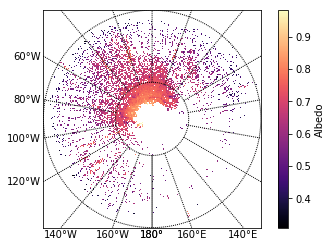

In [155]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SCO2Alb, cmap ='magma')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [156]:
np.nanmean(SCO2Alb)

0.64198062388500066

In [157]:
NAll_Data = binreduce(NWIEmi,NCO2Alb)
NAvg_Data = binreduce(Ultimate_Emissivity_North_Winter_3000, NCO2Alb)

In [158]:
SAll_Data = binreduce(SWIEmi,SCO2Alb)
SAvg_Data = binreduce(Ultimate_Emissivity_South_Winter_3000, SCO2Alb)

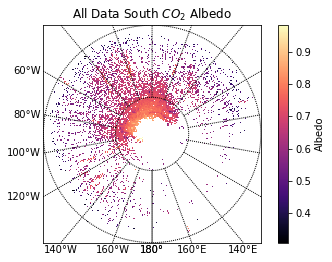

In [159]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SAll_Data[1], cmap ='magma')
plt.title('All Data South $CO_2$ Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [160]:
np.nanmean(SAll_Data[1])

0.64202920956008502

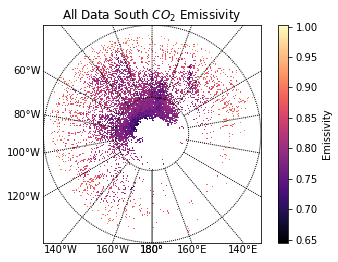

In [161]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SAll_Data[0], cmap ='magma')
plt.title('All Data South $CO_2$ Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [162]:
np.nanmean(SAll_Data[0])

0.8186496238973987

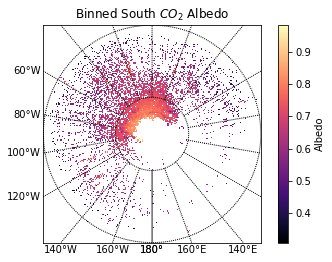

In [163]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SAvg_Data[1], cmap ='magma')
plt.title('Binned South $CO_2$ Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

In [164]:
np.nanmean(SAvg_Data[1])

0.64244782522429267

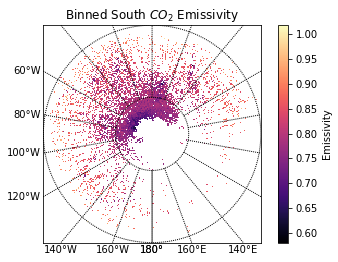

In [165]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SAvg_Data[0], cmap ='magma')
plt.title('Binned South $CO_2$ Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [166]:
np.nanmean(SAvg_Data[0])

0.81054981568714246

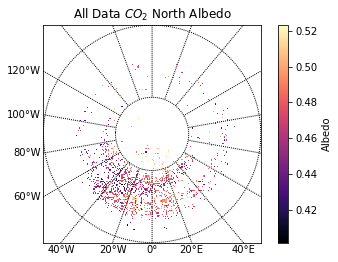

In [167]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NAll_Data[1], origin='upper', cmap = 'magma')
plt.title('All Data $CO_2$ North Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo') 

In [168]:
np.nanmean(NAll_Data[1])

0.46956030253475062

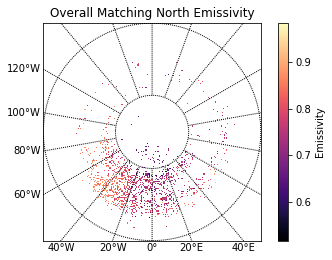

In [169]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NAll_Data[0], origin='upper', cmap = 'magma')
plt.title('Overall Matching North Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity') 

In [170]:
np.nanmean(NAll_Data[0])

0.78316680712450382

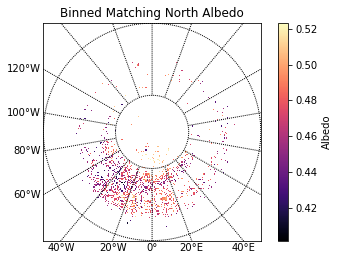

In [171]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NAvg_Data[1], origin='upper', cmap = 'magma')
plt.title('Binned Matching North Albedo')
cbar = plt.colorbar()
cbar.set_label('Albedo') 

In [172]:
np.nanmean(NAvg_Data[1])

0.46966224489795921

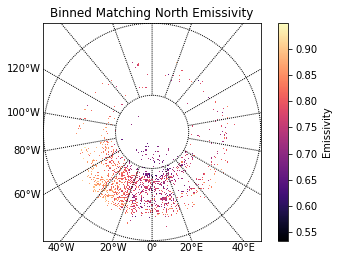

In [173]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NAvg_Data[0], origin='upper', cmap = 'magma')
plt.title('Binned Matching North Emissivity')
cbar = plt.colorbar()
cbar.set_label('Emissivity') 

In [174]:
np.nanmean(NAvg_Data[0])

0.78826265043000432

In [175]:
NAll_Data = binreduce(NWIEmi,NCO2Alb)
NAvg_Data = binreduce(Ultimate_Emissivity_North_Winter_3000, NCO2Alb)

In [176]:
SAll_Data = binreduce(SWIEmi,SCO2Alb)
SAvg_Data = binreduce(Ultimate_Emissivity_South_Winter_3000, SCO2Alb)

In [177]:
NAll_DataA = np.array(NAll_Data[0])
NAll_DataB = np.array(NAll_Data[1])
NAvg_DataA = np.array(NAvg_Data[0])
NAvg_DataB = np.array(NAvg_Data[1])

SAll_DataA = np.array(SAll_Data[0])
SAll_DataB = np.array(SAll_Data[1])
SAvg_DataA = np.array(SAvg_Data[0])
SAvg_DataB = np.array(SAvg_Data[1])

In [178]:
NAll_DataA = NAll_DataA.flatten()
NAll_DataB = NAll_DataB.flatten()
NAvg_DataA = NAvg_DataA.flatten()
NAvg_DataB = NAvg_DataB.flatten()

SAll_DataA = SAll_DataA.flatten()
SAll_DataB = SAll_DataB.flatten()
SAvg_DataA = SAvg_DataA.flatten()
SAvg_DataB = SAvg_DataB.flatten()

In [179]:
NAll_DataA=NAll_DataA[np.logical_not(np.isnan(NAll_DataA))]
NAll_DataB=NAll_DataB[np.logical_not(np.isnan(NAll_DataB))]
NAvg_DataA=NAvg_DataA[np.logical_not(np.isnan(NAvg_DataA))]
NAvg_DataB=NAvg_DataB[np.logical_not(np.isnan(NAvg_DataB))]

SAll_DataA=SAll_DataA[np.logical_not(np.isnan(SAll_DataA))]
SAll_DataB=SAll_DataB[np.logical_not(np.isnan(SAll_DataB))]
SAvg_DataA=SAvg_DataA[np.logical_not(np.isnan(SAvg_DataA))]
SAvg_DataB=SAvg_DataB[np.logical_not(np.isnan(SAvg_DataB))]

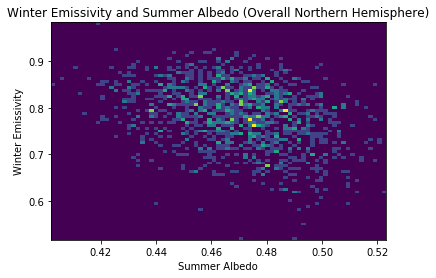

In [180]:
plt.hist2d(NAll_DataB,NAll_DataA, bins = [75,75])
plt.title('Winter Emissivity and Summer Albedo (Overall Northern Hemisphere)')
plt.xlabel('Summer Albedo')
plt.ylabel('Winter Emissivity')
plt.show()

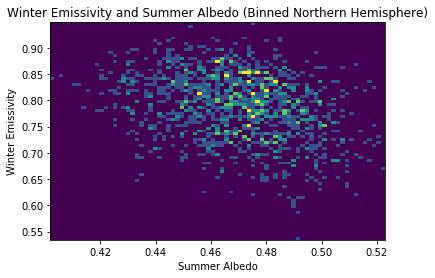

In [181]:
plt.hist2d(NAvg_DataB,NAvg_DataA, bins = [75,75])
plt.title('Winter Emissivity and Summer Albedo (Binned Northern Hemisphere)')
plt.xlabel('Summer Albedo')
plt.ylabel('Winter Emissivity')
plt.show()

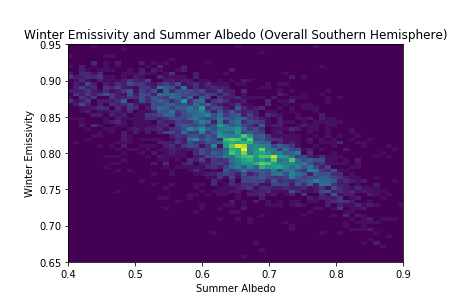

In [182]:
plt.hist2d(SAll_DataB,SAll_DataA, bins = [75,75])
plt.title('Winter Emissivity and Summer Albedo (Overall Southern Hemisphere)')
plt.xlabel('Summer Albedo')
plt.xlim(.4,.9)
plt.ylim(.65,.95)
plt.ylabel('Winter Emissivity')
plt.show()

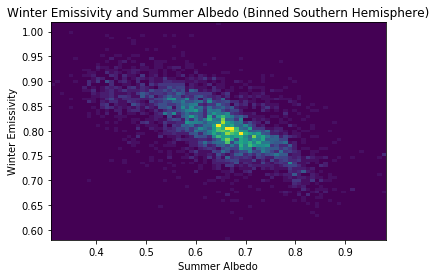

In [183]:
plt.hist2d(SAvg_DataB,SAvg_DataA, bins = [75,75])
plt.title('Winter Emissivity and Summer Albedo (Binned Southern Hemisphere)')
plt.xlabel('Summer Albedo')
plt.ylabel('Winter Emissivity')
plt.show()

In [184]:
NWITCO2 = NWICO2[(NWICO2['Surf_lat'] >= 80.0)]
NWIBCO2 = NWICO2[(NWICO2['Surf_lat'] < 80.0)]

In [185]:
SWITCO2 = SWICO2[(SWICO2['Surf_lat'] <= -80.0)]
SWIBCO2 = SWICO2[(SWICO2['Surf_lat'] > -80.0)]

In [186]:
NWITECoor = poltocar(NWITCO2, 'N', 'Y', NWITCO2['Surf_lat'], NWITCO2['Surf_lon'])
NWIBECoor = poltocar(NWIBCO2, 'N', 'Y', NWIBCO2['Surf_lat'], NWIBCO2['Surf_lon'])
SWITECoor = poltocar(SWITCO2, 'S', 'Y', SWITCO2['Surf_lat'], SWITCO2['Surf_lon'])
SWIBECoor = poltocar(SWIBCO2, 'S', 'Y', SWIBCO2['Surf_lat'], SWIBCO2['Surf_lon'])

In [187]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NWITIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITECoor[0], NWITECoor[1], values= (NWITCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWIBIR, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBECoor[0], NWIBECoor[1], values= (NWIBCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWITIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITECoor[0], SWITECoor[1], values= (SWITCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
SWIBIR, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBECoor[0], SWIBECoor[1], values= (SWIBCO2['T_surf']), statistic ='mean', bins = [xbins, ybins])
NWITFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITECoor[0], NWITECoor[1], values= (NWITCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
NWIBFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBECoor[0], NWIBECoor[1], values= (NWIBCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWITFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITECoor[0], SWITECoor[1], values= (SWITCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])
SWIBFPT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBECoor[0], SWIBECoor[1], values= (SWIBCO2['Frost_T']), statistic ='mean', bins = [xbins, ybins])

In [188]:
NWITEmi = emi(IRFlux(NWITIR), NWITFPT)
NWIBEmi = emi(IRFlux(NWIBIR), NWIBFPT)
SWITEmi = emi(IRFlux(SWITIR), SWITFPT)
SWIBEmi = emi(IRFlux(SWIBIR), SWIBFPT)

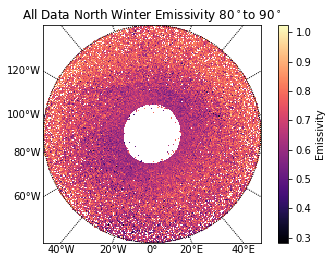

In [189]:
m = Basemap(projection='nplaea',boundinglat=80.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWITEmi, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Emissivity 80$^\circ$to 90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

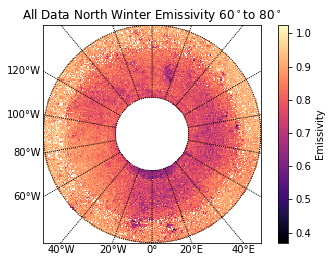

In [190]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NWIBEmi, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Emissivity 60$^\circ$to 80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

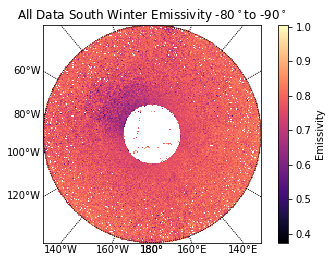

In [191]:
m = Basemap(projection='splaea',boundinglat=-80.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWITEmi, cmap ='magma')
plt.title('All Data South Winter Emissivity -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

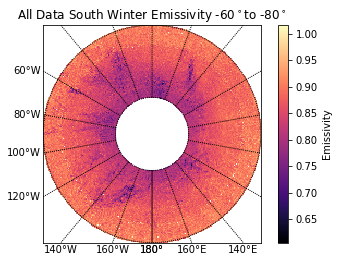

In [192]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SWIBEmi, cmap ='magma')
plt.title('All Data South Winter Emissivity -60$^\circ$to -80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Emissivity')
plt.show()

In [193]:
NAlbT = NAlb[(NAlb['Latitude'] >= 80.0)]
NAlbB = NAlb[(NAlb['Latitude'] < 80.0)]

In [194]:
SAlbT = SAlb[(SAlb['Latitude'] <= -80.0)]
SAlbB = SAlb[(SAlb['Latitude'] > -80.0)]

In [195]:
NWITCoor = poltocar(NAlbT, 'N', 'Y', NAlbT['Latitude'], NAlbT['Longitude'])
NWIBCoor = poltocar(NAlbB, 'N', 'Y', NAlbB['Latitude'], NAlbB['Longitude'])
SWITCoor = poltocar(SAlbT, 'S', 'Y', SAlbT['Latitude'], SAlbT['Longitude'])
SWIBCoor = poltocar(SAlbB, 'S', 'Y', SAlbB['Latitude'], SAlbB['Longitude'])

In [196]:
x_range = np.arange(-1,1,.01)
y_range = np.arange(-1,1,.01)

xbins, ybins = len(x_range), len(y_range)
NALBT, xedges, yedges, binnumber = stats.binned_statistic_2d(NWITCoor[0], NWITCoor[1], values= (NAlbT['Albedo']), statistic ='mean', bins = [xbins, ybins])
NALBB, xedges, yedges, binnumber = stats.binned_statistic_2d(NWIBCoor[0], NWIBCoor[1], values= (NAlbB['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALBT, xedges, yedges, binnumber = stats.binned_statistic_2d(SWITCoor[0], SWITCoor[1], values= (SAlbT['Albedo']), statistic ='mean', bins = [xbins, ybins])
SALBB, xedges, yedges, binnumber = stats.binned_statistic_2d(SWIBCoor[0], SWIBCoor[1], values= (SAlbB['Albedo']), statistic ='mean', bins = [xbins, ybins])

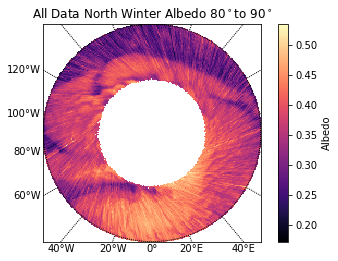

In [197]:
m = Basemap(projection='nplaea',boundinglat=80.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALBT, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Albedo 80$^\circ$to 90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

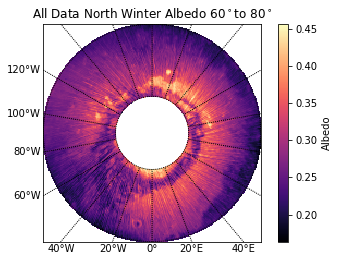

In [198]:
m = Basemap(projection='nplaea',boundinglat=60.0,lon_0=0,resolution='l')
m.drawparallels(np.arange(0.,91.,20.))
m.drawmeridians(np.arange(0.,360.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(NALBB, cmap = 'magma', origin = 'upper')
plt.title('All Data North Winter Albedo 60$^\circ$to 80$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

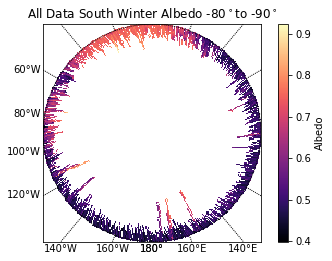

In [199]:
m = Basemap(projection='splaea',boundinglat=-80.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SALBT, cmap ='magma')
plt.title('All Data South Winter Albedo -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()

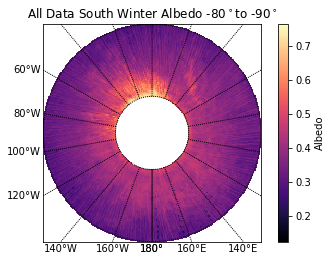

In [200]:
m = Basemap(projection='splaea',boundinglat=-60.0,lon_0=180,resolution='l')
m.drawparallels(np.arange(-80.,-40.,20.))
m.drawmeridians(np.arange(-180.,181.,20.),labels=[1,0,0,1],fontsize=10)
m.imshow(SALBB, cmap ='magma')
plt.title('All Data South Winter Albedo -80$^\circ$to -90$^\circ$')
cbar = plt.colorbar()
cbar.set_label('Albedo')
plt.show()